### This script contains the following:

#### 1. Importing your libraries and data
#### 2. Optimizing the Scaled dataset: BUDAPEST
#### 3. Optimizing the Scaled dataset: MADRID
#### 4. Optimizing the Scaled dataset: STOCKHOLM

### 1. Importing libraries and dataset

In [877]:
# Importing libraries
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d

from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

In [878]:
# Defining a path for importing/exporting
path = r'/Users/peterguan/ClimateWins ML'

In [879]:
# Importing the Scaled ClimateWins dataset
climatewins_scaled = pd.read_csv(r'/Users/peterguan/ClimateWins ML/climatewins_scaled.csv', index_col = False)

In [880]:
# Checking if the dataset imported succesfully
climatewins_scaled.head()

,Unnamed: 0,id,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,0,-1.731975,19600101,-1.599964,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,...,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237
1,1,-1.731824,19600102,-1.599964,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,...,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141
2,2,-1.731673,19600103,-1.599964,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,...,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078
3,3,-1.731523,19600104,-1.599964,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,...,0.783085,0.480538,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-0.998679,-0.164486,-0.838511
4,4,-1.731372,19600105,-1.599964,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,...,-1.670486,-0.363113,1.729970,-0.794645,-0.490810,-0.024706,0.672505,-1.509396,-1.339569,-1.471186


### 2. Optimizing the Scaled Dataset

In [882]:
# Reducing to just the MEAN temperature
climatewins_reduced = climatewins_scaled[['DATE', 'MONTH','BASEL_temp_mean',
 'BELGRADE_temp_mean',
 'BUDAPEST_temp_mean',
 'DEBILT_temp_mean',
 'DUSSELDORF_temp_mean',
 'GDANSK_temp_mean',
 'HEATHROW_temp_mean',
 'KASSEL_temp_mean',
 'LJUBLJANA_temp_mean',
 'MAASTRICHT_temp_mean',
 'MADRID_temp_mean',
 'MUNCHENB_temp_mean',
 'OSLO_temp_mean',
 'ROMA_temp_mean',
 'SONNBLICK_temp_mean',
 'STOCKHOLM_temp_mean',
 'TOURS_temp_mean',
 'VALENTIA_temp_mean']].copy()

In [883]:
# Checking if the reduction was successful
climatewins_reduced.head()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,-1.599964,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,-1.599964,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,-1.599964,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,-1.599964,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,-1.599964,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396


In [884]:
# Dropping the DATE and MONTH data as those numbers are not scaled with the rest (NO MEANS in those columns)
notemp = climatewins_reduced.drop(['DATE','MONTH'], axis=1)

In [885]:
# Creating a whisker plot of the data to see variations in temperatures
notemp.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18]),
 [Text(1, 0, 'BASEL_temp_mean'),
  Text(2, 0, 'BELGRADE_temp_mean'),
  Text(3, 0, 'BUDAPEST_temp_mean'),
  Text(4, 0, 'DEBILT_temp_mean'),
  Text(5, 0, 'DUSSELDORF_temp_mean'),
  Text(6, 0, 'GDANSK_temp_mean'),
  Text(7, 0, 'HEATHROW_temp_mean'),
  Text(8, 0, 'KASSEL_temp_mean'),
  Text(9, 0, 'LJUBLJANA_temp_mean'),
  Text(10, 0, 'MAASTRICHT_temp_mean'),
  Text(11, 0, 'MADRID_temp_mean'),
  Text(12, 0, 'MUNCHENB_temp_mean'),
  Text(13, 0, 'OSLO_temp_mean'),
  Text(14, 0, 'ROMA_temp_mean'),
  Text(15, 0, 'SONNBLICK_temp_mean'),
  Text(16, 0, 'STOCKHOLM_temp_mean'),
  Text(17, 0, 'TOURS_temp_mean'),
  Text(18, 0, 'VALENTIA_temp_mean')])

In [886]:
# Reducing the dataset to a single year
climatewins_budapest_1960 = climatewins_reduced[climatewins_reduced['DATE'].astype(str).str.contains('1960')] 

In [887]:
# Checking if the reduction was successful 
climatewins_budapest_1960.head()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,-1.599964,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,-1.599964,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,-1.599964,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,-1.599964,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,-1.599964,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396


In [888]:
# Checking the dimensions
climatewins_budapest_1960.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,1.960067e+07,0.001171,-0.102317,-0.032384,-0.063919,-0.052666,-0.034416,-0.067706,-0.103366,0.026208,-0.074499,-0.063840,-0.130480,-0.101680,-0.078422,0.092554,-0.175958,-0.092804,-0.059940,-0.057276
std,3.457653e+02,1.003590,0.935826,0.920271,0.946637,0.910451,0.919531,0.978767,0.919195,0.964448,0.906193,0.902235,0.979590,0.938523,0.998018,1.002362,0.884235,0.988702,0.944029,1.127911
min,1.960010e+07,-1.599964,-3.190431,-2.401472,-2.416664,-2.645913,-2.874442,-2.922584,-2.307849,-3.446307,-2.714923,-3.247725,-2.322710,-3.017997,-2.249500,-2.408610,-3.502727,-2.356684,-3.112470,-2.951420
25%,1.960040e+07,-0.728781,-0.756099,-0.594120,-0.675681,-0.668134,-0.661766,-0.825294,-0.840262,-0.666507,-0.738129,-0.712209,-0.890557,-0.777863,-0.738711,-0.653227,-0.764178,-0.798501,-0.692653,-0.848468
50%,1.960070e+07,0.142401,-0.053300,0.055618,-0.005167,-0.011511,-0.002750,-0.096358,-0.071526,0.082894,-0.002507,0.052946,-0.294107,-0.001827,-0.168373,-0.009165,-0.124331,-0.179582,0.032900,-0.037330
75%,1.960098e+07,0.940984,0.649499,0.662798,0.744750,0.692578,0.715174,0.757265,0.714681,0.802762,0.699815,0.649317,0.787590,0.626541,0.869157,1.110576,0.475298,0.877867,0.683937,0.893978
max,1.960123e+07,1.594371,1.820830,1.843109,1.806397,1.847601,1.970619,1.834684,1.745486,2.002543,1.668536,1.688278,1.936682,1.858144,1.985564,1.952486,1.967058,1.686504,1.938947,2.606381


In [889]:
# Dropping the DATE and MONTH data as those numbers are not scaled with the rest (NO MEANS in those columns)
notempyear = climatewins_budapest_1960.drop(['DATE','MONTH'], axis=1)

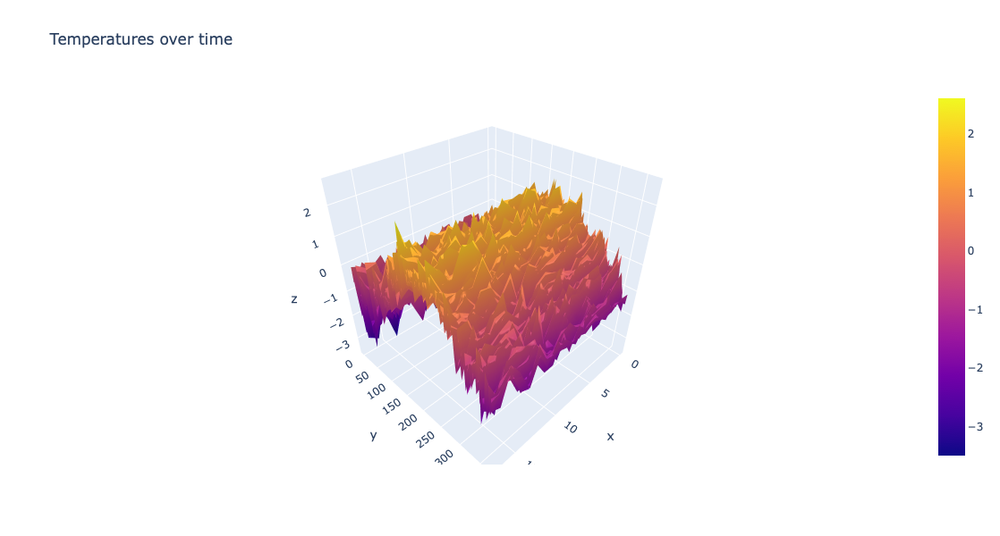

In [890]:
# Plotting ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate it

fig = go.Figure(data=[go.Surface(z=notempyear.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [891]:
# Creating a set of data from 1 to 365 (or to 366 if it's a leap year!)
# Scaling this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [892]:
# Checking the number of rows
n_rows = climatewins_budapest_1960.shape[0]
n_rows

366

In [893]:
# Translating the chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=climatewins_budapest_1960['BUDAPEST_temp_mean'].to_numpy().reshape(n_rows,1) # BUDAPEST weather station chosen

In [894]:
# Checking the dimensions of X and Y 
X.shape, y.shape

((366, 2), (366, 1))

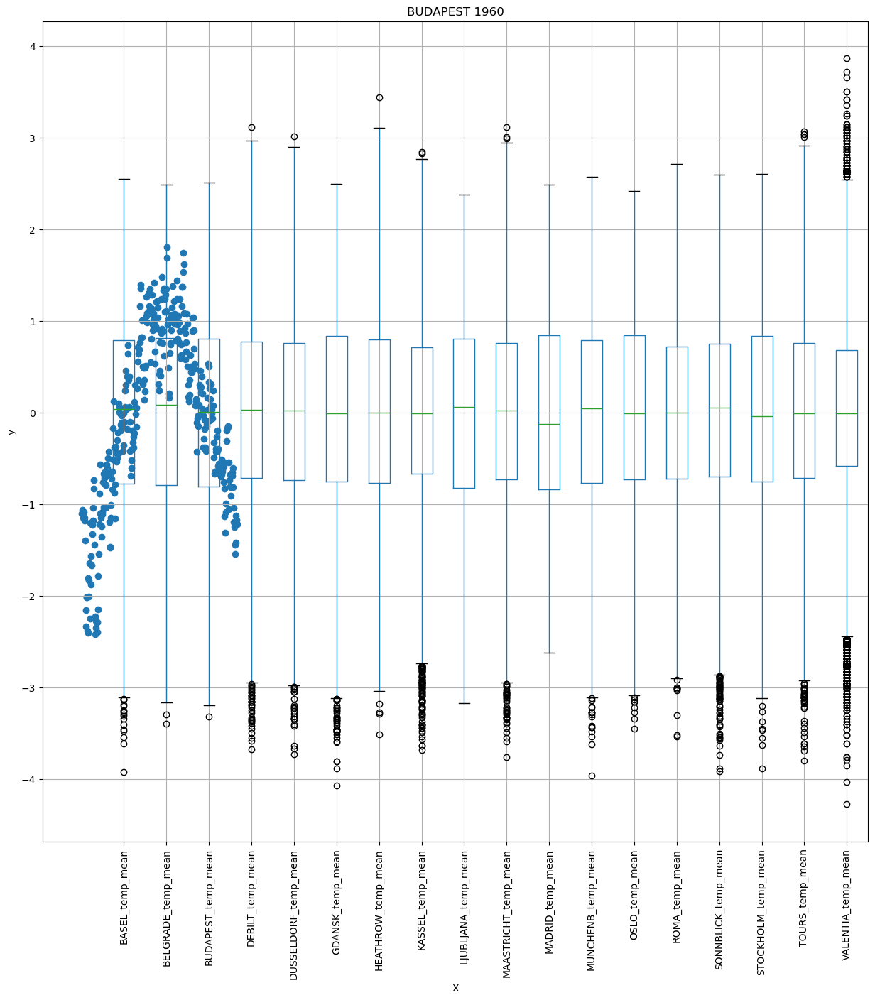

In [895]:
# Looking at one year of temperature data over time
plt.scatter(x=index['index'], y=climatewins_singleyear['BUDAPEST_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('BUDAPEST 1960');

# Displaying the visualization
plt.show()

In [896]:
# Checking the MINIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_budapest_1960['BUDAPEST_temp_mean'].min()

-2.4166643260714715

In [897]:
# Checking the MAXIMUM temperature 
climatewins_budapest_1960['BUDAPEST_temp_mean'].max()

1.8063974207400055

In [898]:
# Computing the LOSS function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [899]:
# Computing the cost
compute_cost(X,y)

array([0.44887979])

In [900]:
# This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [901]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=100 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-5],[-1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.01 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 89.8 ms, sys: 1.6 ms, total: 91.4 ms
Wall time: 31.3 ms


In [902]:
theta

array([[-3.22548024],
       [ 1.4017197 ]])

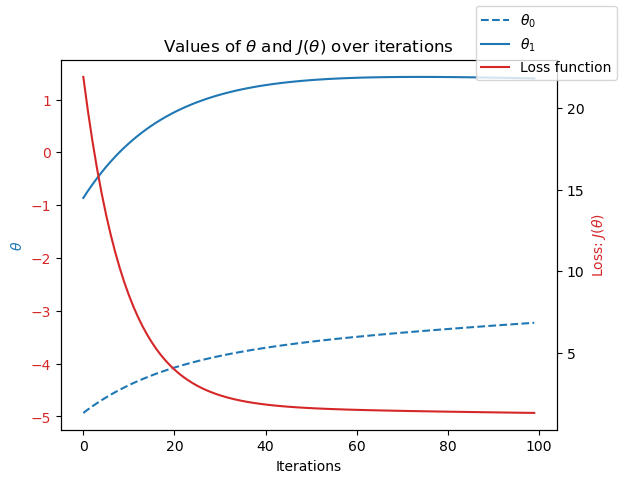

In [903]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

# Displaying the visualization
plt.show()

In [904]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.45 s, sys: 34.8 ms, total: 1.49 s
Wall time: 1.04 s


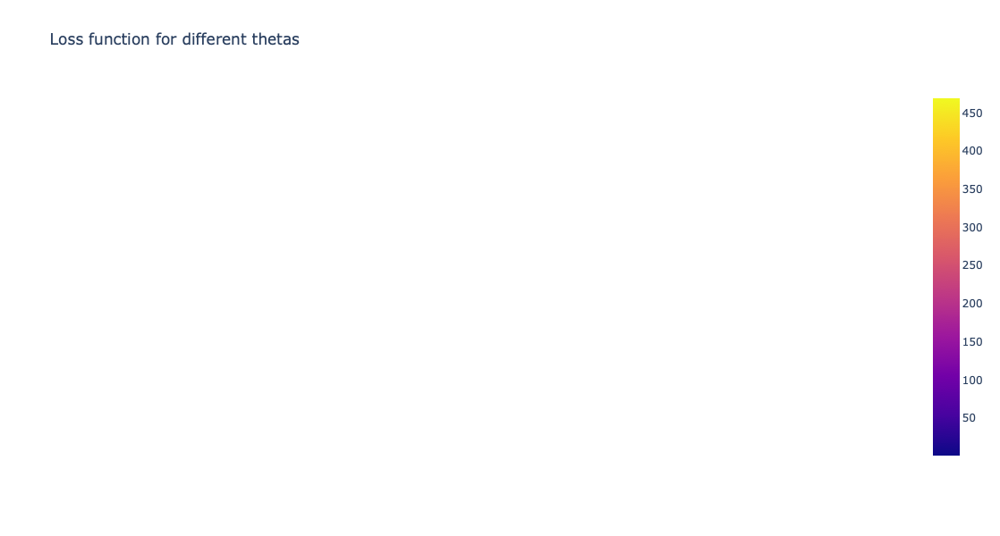

In [1271]:
# Showing the loss function
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

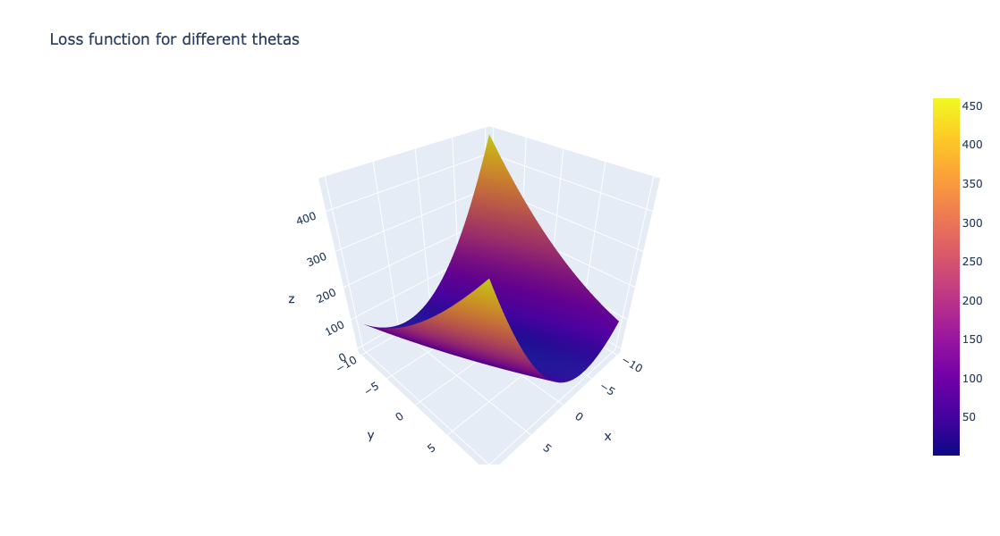

In [906]:
# Showing the loss function towards the minimum
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [907]:
# Rerunning the optimization
num_iterations=10 #<---start with the same iterations as above
theta_init=np.array([[1],[1]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

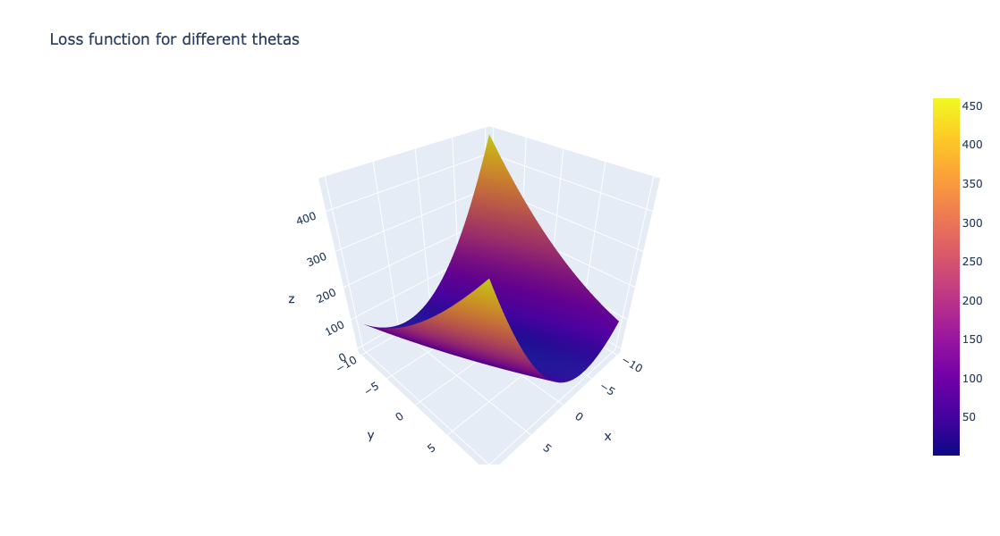

In [908]:
# Showing the new loss function
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

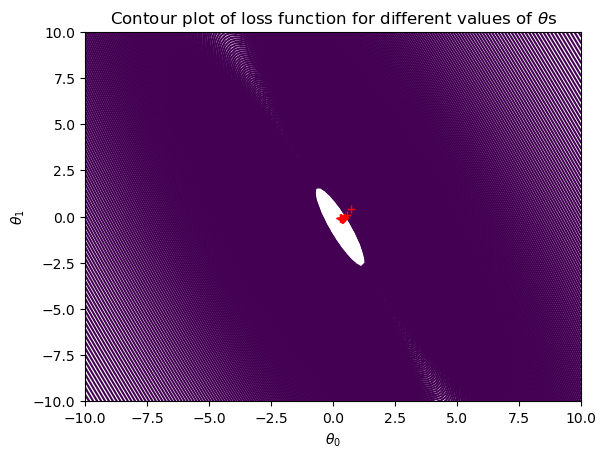

In [909]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');

plt.show()

### BUDAPEST 1990

In [911]:
# Reducing the dataset to a single year
climatewins_budapest_1990 = climatewins_reduced[climatewins_reduced['DATE'].astype(str).str.contains('1990')] 

In [912]:
# Checking if the reduction was successful 
climatewins_budapest_1990.head()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
10958,19900101,-1.599964,-1.696559,-1.584333,-1.369721,-1.506712,-1.490139,-1.298463,-1.172216,-1.541424,-1.479805,-1.447359,-0.974801,-1.811529,-1.594218,-1.937140,-0.460708,-1.274353,-1.528019,-1.148890
10959,19900102,-1.599964,-1.655817,-1.538937,-1.428538,-1.427601,-1.269240,-1.081061,-1.049918,-1.452825,-1.528241,-1.342338,-1.136550,-1.522480,-1.497139,-1.566700,-0.782460,-1.448521,-1.292705,-1.028721
10960,19900103,-1.599964,-1.710140,-1.527588,-1.440302,-1.301023,-1.460686,-1.196156,-1.259573,-1.570958,-1.382933,-1.387347,-1.069155,-1.359104,-1.703431,-1.600376,-0.972586,-1.361437,-1.261329,-0.878510
10961,19900104,-1.599964,-1.506430,-1.788618,-1.616753,-1.538357,-1.401779,-1.515865,-1.032446,-1.570958,-1.516132,-1.642398,-1.136550,-1.710990,-1.023880,-1.583538,-1.001836,-0.938458,-1.386830,-1.269058
10962,19900105,-1.599964,-1.411366,-2.083696,-1.687333,-1.063690,-1.107247,-1.592595,-0.805320,-1.408526,-1.794639,-1.237316,-1.082634,-1.447075,-0.878261,-1.886626,-0.870210,-0.963339,-1.135828,-0.397835


In [913]:
# Checking the dimensions
climatewins_budapest_1990.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,1.990067e+07,0.004762,0.070861,0.043663,0.027964,0.139493,0.146131,0.150405,0.152728,0.104417,-0.001047,0.095736,0.063753,0.003406,0.144391,0.038743,0.037507,0.131603,0.137621,0.135022
std,3.454755e+02,1.002610,0.901173,0.898311,0.906770,0.839960,0.882042,0.756431,0.942064,0.930487,0.911890,0.885778,1.023386,0.923807,0.825958,1.130786,0.866875,0.789326,0.980101,1.096645
min,1.990010e+07,-1.599964,-1.818785,-2.537662,-2.357847,-1.633290,-1.607952,-1.592595,-1.888539,-1.748156,-2.266890,-1.747420,-1.743109,-2.490168,-1.933994,-2.088684,-2.435095,-1.572927,-2.139837,-2.290492
25%,1.990040e+07,-0.728781,-0.582946,-0.631005,-0.640390,-0.525734,-0.532908,-0.518374,-0.630607,-0.625900,-0.704829,-0.607188,-0.799573,-0.680466,-0.477811,-0.893171,-0.519208,-0.552800,-0.649512,-0.788384
50%,1.990070e+07,0.142401,0.109668,0.152086,0.077177,0.154622,0.173970,0.172198,0.138129,0.082894,-0.002507,0.097955,-0.112140,0.073577,0.080392,-0.051261,0.109671,0.081670,0.150558,0.142923
75%,1.990100e+07,1.013583,0.734378,0.708194,0.724164,0.708400,0.763035,0.786039,0.802037,0.762154,0.663488,0.683074,0.993146,0.701946,0.857022,1.026385,0.665425,0.828105,0.856501,0.863935
max,1.990123e+07,1.594371,1.997379,1.740967,1.876978,2.417201,2.765857,1.898625,2.828705,2.475072,1.801735,2.603464,2.165827,1.946116,1.767136,2.019839,1.879307,1.985078,2.644891,2.966887


In [914]:
# Dropping the DATE and MONTH data as those numbers are not scaled with the rest (NO MEANS in those columns)
notempyear_budapest_1990 = climatewins_budapest_1990.drop(['DATE','MONTH'], axis=1)

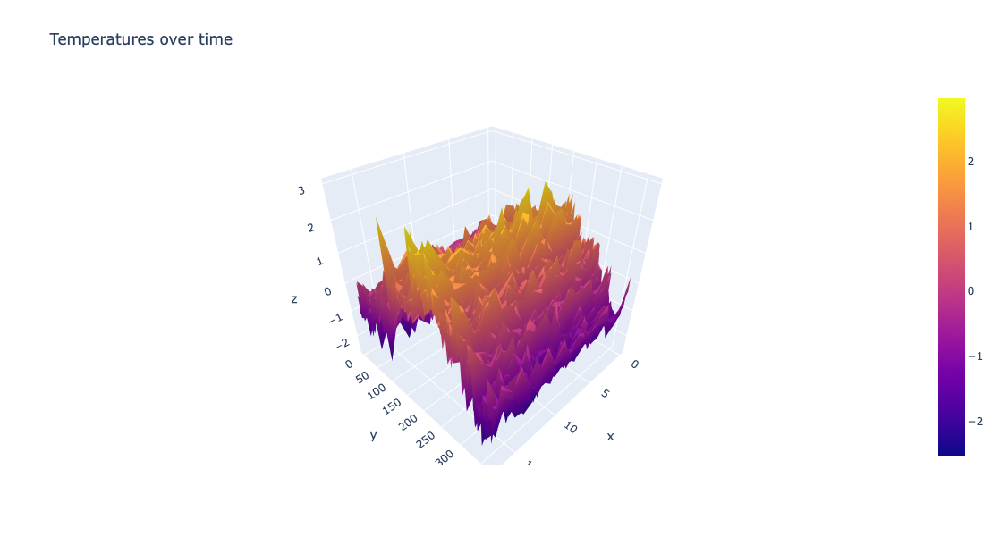

In [915]:
# Plotting ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate it

fig = go.Figure(data=[go.Surface(z=notempyear_budapest_1990.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [916]:
# Creating a set of data from 1 to 365 (or to 366 if it's a leap year!)
# Scaling this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [917]:
# Checking the number of rows
n_rows_budapest_1990 = climatewins_budapest_1990.shape[0]
n_rows_budapest_1990

365

In [918]:
# Translating the chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows_budapest_1990,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows_budapest_1990,1))
X = np.concatenate((ones, X), axis=1)
y=climatewins_budapest_1990['BUDAPEST_temp_mean'].to_numpy().reshape(n_rows_budapest_1990,1) # BUDAPEST weather station chosen

In [919]:
# Checking the dimensions of X and Y 
X.shape, y.shape

((365, 2), (365, 1))

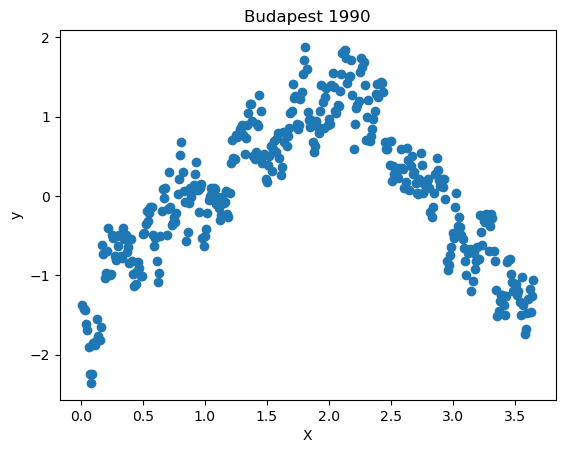

In [920]:
# Looking at one year of temperature data over time
plt.scatter(x=index['index'], y=climatewins_budapest_1990['BUDAPEST_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('Budapest 1990');

# Displaying the visualization
plt.show()

In [921]:
# Checking the MINIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_budapest_1990['BUDAPEST_temp_mean'].min()

-2.357847310099167

In [922]:
# Checking the MAXIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_budapest_1990['BUDAPEST_temp_mean'].max()

1.8769778399067711

In [923]:
# Computing the LOSS function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [924]:
# Computing the cost
compute_cost(X,y)

array([0.41038062])

In [925]:
# This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [926]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=200 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-5],[-1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.01 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 179 ms, sys: 1.12 ms, total: 180 ms
Wall time: 61.2 ms


In [927]:
theta

array([[-2.54508347],
       [ 1.12105072]])

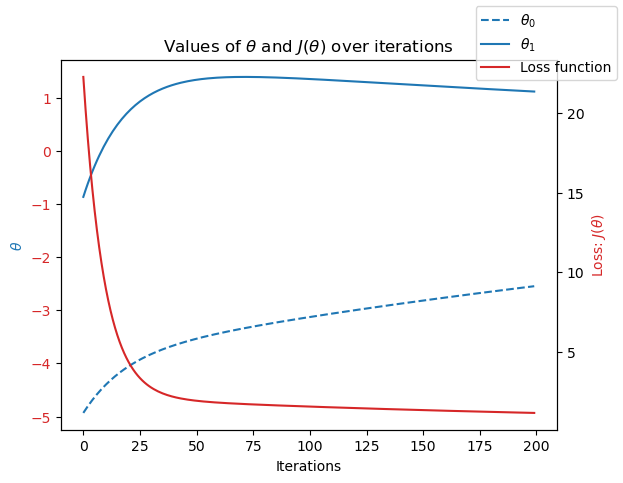

In [928]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

# Displaying the visualization
plt.show()

In [929]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.45 s, sys: 34.5 ms, total: 1.48 s
Wall time: 1.04 s


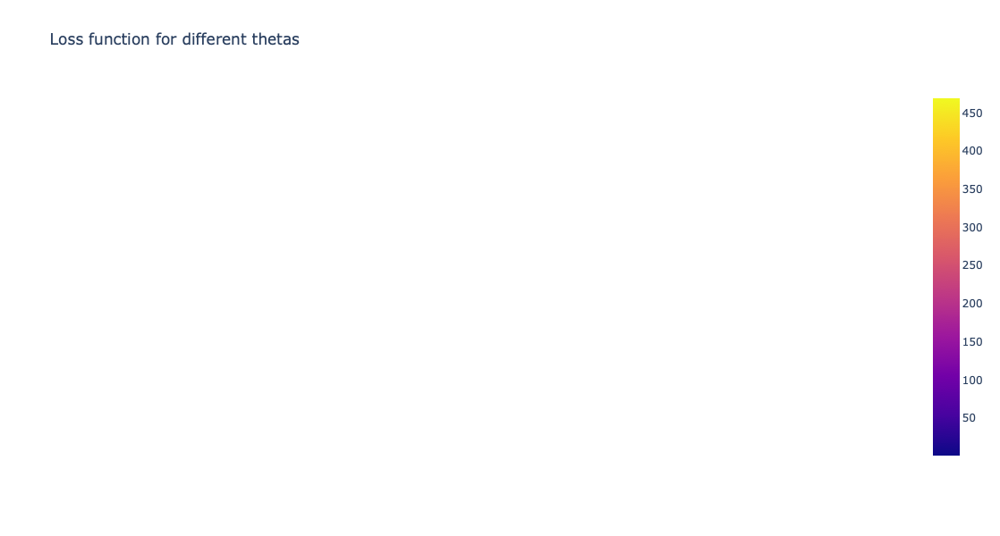

In [1273]:
# Showing the loss function
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### Budapest 2020

In [932]:
# Reducing the dataset to a single year (using STARTSWITH for 2020)
climatewins_budapest_2020 = climatewins_reduced[climatewins_reduced['DATE'].astype(str).str.startswith('2020')]

In [933]:
# Checking if the reduction was successful 
climatewins_budapest_2020

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
21915,20200101,-1.599964,-1.465688,-1.209812,-0.934476,-1.459245,-1.387053,-0.735776,-1.102331,-0.005705,-1.370824,-1.612392,-1.123071,-1.032352,-0.550620,-0.000746,-0.153581,-0.478156,-0.869139,-0.007287
21916,20200102,-1.599964,-1.397785,-1.141717,-1.169744,-0.968756,-1.225060,-0.953178,-0.595665,-0.005705,-1.625113,-0.997267,-1.203946,-1.321402,-0.283654,-0.000746,-0.051205,-0.192023,-0.414197,-0.007287
21917,20200103,-1.599964,-0.691591,-1.357351,-1.569699,-0.383334,-0.444548,-0.799717,-0.386009,-0.005705,-1.419260,-0.397145,-1.500486,-0.693033,-0.235114,-0.000746,0.007295,-0.241785,-0.288696,-0.007287
21918,20200104,-1.599964,-0.596526,-1.504889,-1.063873,-0.525734,-0.827441,-0.556739,-0.980032,-0.005705,-1.104426,-0.772222,-1.069155,-0.592494,-0.696239,-0.000746,-0.694709,-0.615003,-0.978952,-0.007287
21919,20200105,-1.599964,-1.180494,-1.050924,-1.040346,-0.494089,-0.635995,-0.722987,-0.648078,-0.005705,-1.225516,-0.637194,-1.176988,-0.818707,-0.793317,-0.000746,-1.382089,-0.901136,-0.822076,-0.007287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,20201227,1.594371,-1.180494,-1.130368,-1.369721,-0.794712,-0.871621,-1.017119,-0.875205,-0.005705,-1.382933,-0.877243,-1.635277,-1.396806,-0.429272,-0.000746,-1.148087,-0.391072,-0.947577,-0.007287
22277,20201228,1.594371,-0.786655,-0.528863,-0.863895,-1.016223,-0.945254,-0.710199,-1.783711,-0.005705,-1.261843,-1.087286,-1.244383,-1.095189,-0.623429,-0.000746,-1.177337,-0.391072,-1.135828,-0.007287
22278,20201229,1.594371,-0.813817,-0.131643,-0.346305,-1.000401,-1.357599,-0.480009,-1.539113,-0.005705,-0.947009,-1.207310,-1.406132,-0.781005,-0.502081,-0.000746,-1.235838,-0.366191,-1.041702,-0.007287
22279,20201230,1.594371,-1.058269,-0.052199,-0.499230,-0.921290,-1.048340,-0.838082,-1.521642,-0.005705,-0.934900,-1.012270,-1.365695,-0.856409,-0.574890,-0.000746,-1.279713,-0.565240,-1.120141,-0.007287


In [934]:
# Checking the dimensions
climatewins_budapest_2020.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,366.000000,366.000000,3.660000e+02
mean,2.020067e+07,0.001171,0.236087,0.191498,0.172345,0.263519,0.226841,0.246097,0.241620,-5.705221e-03,0.170559,0.279836,0.145252,0.250035,0.275909,-7.461638e-04,0.256961,0.295811,0.319435,-7.287352e-03
std,3.457653e+02,1.003590,0.934854,0.915643,0.923699,0.880960,0.905961,0.815164,0.974223,4.777020e-17,0.916080,0.913584,1.003402,0.875189,0.783143,4.451314e-18,0.888164,0.788996,0.922377,4.603310e-17
min,2.020010e+07,-1.599964,-1.682979,-1.629730,-1.581463,-1.490890,-1.607952,-1.336828,-2.115665,-5.705221e-03,-1.625113,-1.732417,-1.635277,-1.434508,-1.290846,-7.461638e-04,-2.113343,-1.075304,-1.543707,-7.287352e-03
25%,2.020040e+07,-0.728781,-0.552389,-0.560073,-0.590396,-0.430800,-0.503455,-0.425658,-0.508308,-5.705221e-03,-0.644284,-0.427152,-0.637824,-0.476246,-0.356463,-7.461638e-04,-0.292519,-0.328869,-0.414197,-7.287352e-03
50%,2.020070e+07,0.142401,0.238684,0.237205,0.177166,0.233733,0.173970,0.140227,0.103186,-5.705221e-03,0.209401,0.232983,-0.091921,0.293506,0.110729,-7.461638e-04,0.248609,0.112771,0.323121,-7.287352e-03
75%,2.020098e+07,0.940984,0.978830,0.986248,0.947669,0.898267,0.851395,0.949090,1.029164,-5.705221e-03,0.923832,0.949378,0.996516,0.953293,0.866124,-7.461638e-04,0.914051,0.949400,0.966314,-7.287352e-03
max,2.020123e+07,1.594371,2.309734,1.945251,1.935795,2.686179,2.500777,2.039297,3.038360,-5.705221e-03,1.934934,2.783501,2.327576,2.147194,2.203991,-7.461638e-04,2.230310,2.159246,2.660579,-7.287352e-03


In [935]:
# Dropping the DATE and MONTH data as those numbers are not scaled with the rest (NO MEANS in those columns)
notempyear_budapest_2020 = climatewins_budapest_2020.drop(['DATE','MONTH'], axis=1)

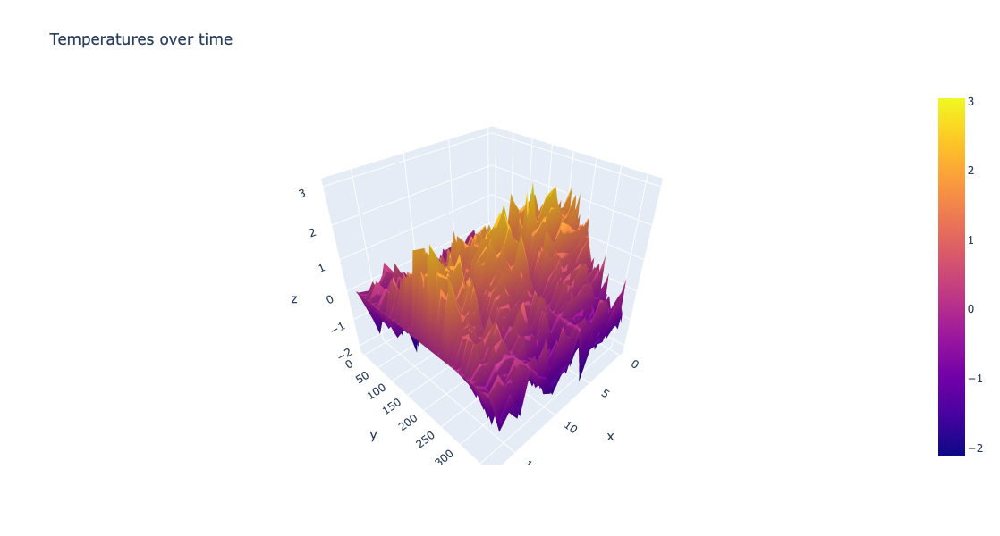

In [936]:
# Plotting ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate it

fig = go.Figure(data=[go.Surface(z=notempyear_budapest_2020.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [937]:
# Creating a set of data from 1 to 365 (or to 366 if it's a leap year!)
# Scaling this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [938]:
# Checking the number of rows
n_rows_budapest_2020 = climatewins_budapest_2020.shape[0]
n_rows_budapest_2020

366

In [939]:
# Translating the chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows_budapest_2020,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows_budapest_2020,1))
X = np.concatenate((ones, X), axis=1)
y=climatewins_budapest_2020['BUDAPEST_temp_mean'].to_numpy().reshape(n_rows_budapest_2020,1) # BUDAPEST weather station chosen

In [940]:
# Checking the dimensions of X and Y 
X.shape, y.shape

((366, 2), (366, 1))

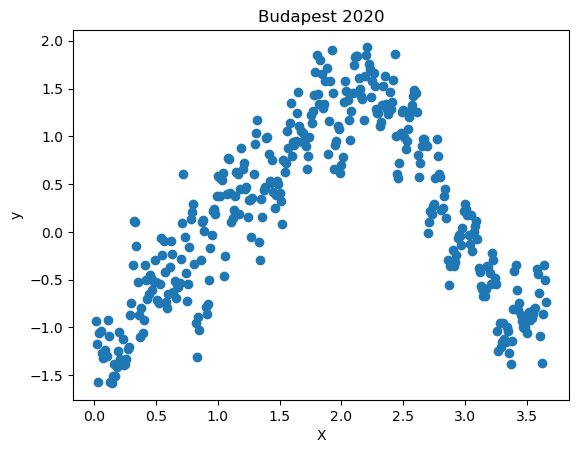

In [941]:
# Looking at one year of temperature data over time
plt.scatter(x=index['index'], y=climatewins_budapest_2020['BUDAPEST_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('Budapest 2020');

# Displaying the visualization
plt.show()

In [942]:
# Checking the MINIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_budapest_2020['BUDAPEST_temp_mean'].min()

-1.5814626992647445

In [943]:
# Checking the MAXIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_budapest_2020['BUDAPEST_temp_mean'].max()

1.9357948558790756

In [944]:
# Computing the LOSS function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [945]:
# Computing the cost
compute_cost(X,y)

array([0.44029615])

In [946]:
# This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [947]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=200 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-5],[-1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 191 ms, sys: 4.46 ms, total: 196 ms
Wall time: 64.8 ms


In [948]:
theta

array([[-0.1450615 ],
       [ 0.16702296]])

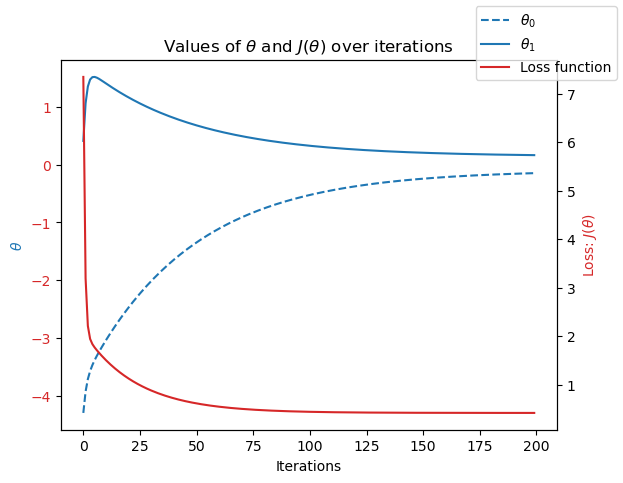

In [949]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

# Displaying the visualization
plt.show()

In [950]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.44 s, sys: 40.2 ms, total: 1.48 s
Wall time: 1.04 s


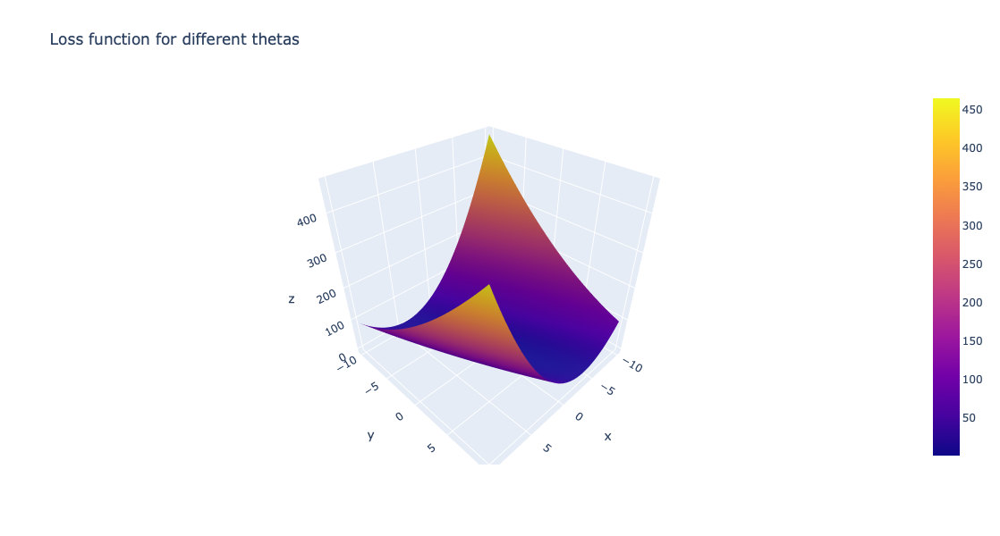

In [951]:
# Showing the loss function
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### Madrid 1960

In [953]:
# Reducing the dataset to a single year
climatewins_madrid_1960 = climatewins_reduced[climatewins_reduced['DATE'].astype(str).str.contains('1960')]

In [954]:
# Checking if the reduction was successful 
climatewins_madrid_1960

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,-1.599964,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,-1.599964,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,-1.599964,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,-1.599964,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,-1.599964,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,19601227,1.594371,-1.289140,-1.277907,-1.440302,-1.126979,-0.974707,-0.940389,-1.469228,-0.891697,-1.721985,-0.997267,-1.069155,-1.120324,-0.417137,-1.785596,-0.914086,-0.403513,-1.104453,-1.629564
362,19601228,1.594371,-1.289140,-1.255208,-1.416775,-1.522534,-1.283966,-0.978754,-1.469228,-1.054129,-1.479805,-1.342338,-1.338737,-1.321402,-0.550620,-1.381479,-1.279713,-0.565240,-1.653520,-1.509396
363,19601229,1.594371,-1.207656,-1.221161,-1.122690,-1.570001,-1.313420,-1.234521,-1.434286,-1.305160,-1.443478,-1.342338,-0.920885,-1.459643,-0.708373,-1.819273,-1.659965,-0.615003,-1.073078,-0.998679
364,19601230,1.594371,-1.547172,-1.243859,-1.169744,-1.316845,-1.372326,-0.889236,-1.084860,-1.393759,-1.273952,-1.177304,-0.772615,-1.547614,-0.829722,-1.549861,-1.674591,-0.726968,-0.900514,-1.239016


In [955]:
# Checking the dimensions
climatewins_madrid_1960.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,1.960067e+07,0.001171,-0.102317,-0.032384,-0.063919,-0.052666,-0.034416,-0.067706,-0.103366,0.026208,-0.074499,-0.063840,-0.130480,-0.101680,-0.078422,0.092554,-0.175958,-0.092804,-0.059940,-0.057276
std,3.457653e+02,1.003590,0.935826,0.920271,0.946637,0.910451,0.919531,0.978767,0.919195,0.964448,0.906193,0.902235,0.979590,0.938523,0.998018,1.002362,0.884235,0.988702,0.944029,1.127911
min,1.960010e+07,-1.599964,-3.190431,-2.401472,-2.416664,-2.645913,-2.874442,-2.922584,-2.307849,-3.446307,-2.714923,-3.247725,-2.322710,-3.017997,-2.249500,-2.408610,-3.502727,-2.356684,-3.112470,-2.951420
25%,1.960040e+07,-0.728781,-0.756099,-0.594120,-0.675681,-0.668134,-0.661766,-0.825294,-0.840262,-0.666507,-0.738129,-0.712209,-0.890557,-0.777863,-0.738711,-0.653227,-0.764178,-0.798501,-0.692653,-0.848468
50%,1.960070e+07,0.142401,-0.053300,0.055618,-0.005167,-0.011511,-0.002750,-0.096358,-0.071526,0.082894,-0.002507,0.052946,-0.294107,-0.001827,-0.168373,-0.009165,-0.124331,-0.179582,0.032900,-0.037330
75%,1.960098e+07,0.940984,0.649499,0.662798,0.744750,0.692578,0.715174,0.757265,0.714681,0.802762,0.699815,0.649317,0.787590,0.626541,0.869157,1.110576,0.475298,0.877867,0.683937,0.893978
max,1.960123e+07,1.594371,1.820830,1.843109,1.806397,1.847601,1.970619,1.834684,1.745486,2.002543,1.668536,1.688278,1.936682,1.858144,1.985564,1.952486,1.967058,1.686504,1.938947,2.606381


In [956]:
# Dropping the DATE and MONTH data as those numbers are not scaled with the rest (NO MEANS in those columns)
notempyear_madrid_1960 = climatewins_madrid_1960.drop(['DATE','MONTH'], axis=1)

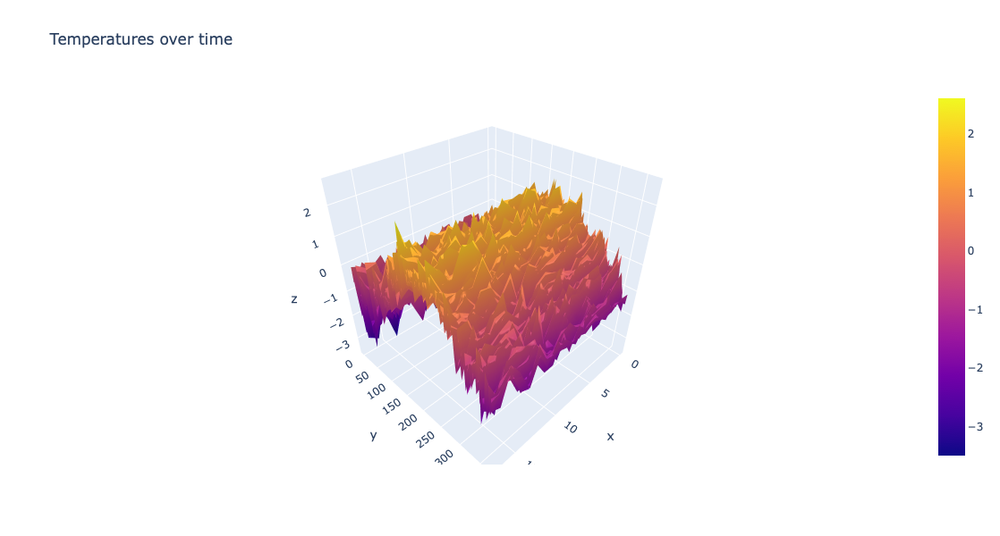

In [957]:
# Plotting ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate it

fig = go.Figure(data=[go.Surface(z=notempyear_madrid_1960.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [958]:
# Creating a set of data from 1 to 365 (or to 366 if it's a leap year!)
# Scaling this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [959]:
# Checking the number of rows
n_rows_madrid_1960 = climatewins_madrid_1960.shape[0]
n_rows_madrid_1960

366

In [960]:
# Translating the chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows_madrid_1960,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows_madrid_1960,1))
X = np.concatenate((ones, X), axis=1)
y=climatewins_madrid_1960['MADRID_temp_mean'].to_numpy().reshape(n_rows_madrid_1960,1) # MADRID weather station chosen

In [961]:
# Checking the dimensions of X and Y 
X.shape, y.shape

((366, 2), (366, 1))

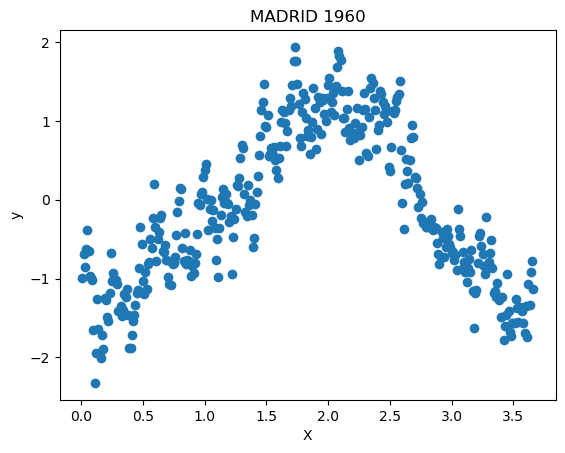

In [962]:
# Looking at one year of temperature data over time
plt.scatter(x=index['index'], y=climatewins_madrid_1960['MADRID_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('MADRID 1960');

# Displaying the visualization
plt.show()

In [963]:
# Checking the MINIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_madrid_1960['MADRID_temp_mean'].min()

-2.322710316206882

In [964]:
# Checking the MAXIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_madrid_1960['MADRID_temp_mean'].max()

1.9366821017377809

In [965]:
# Computing the LOSS function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [966]:
# Computing the cost
compute_cost(X,y)

array([0.48699971])

In [967]:
# This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [968]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.02 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 459 ms, sys: 4.2 ms, total: 463 ms
Wall time: 154 ms


In [969]:
theta

array([[-0.27037156],
       [ 0.08027708]])

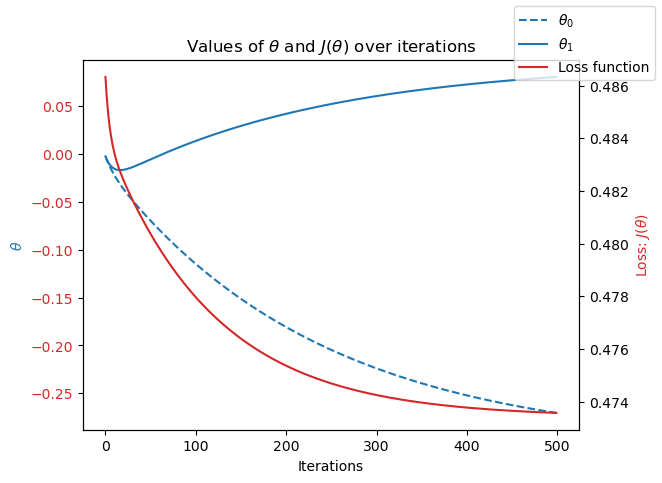

In [970]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

# Displaying the visualization
plt.show()

In [971]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.45 s, sys: 34.8 ms, total: 1.48 s
Wall time: 1.05 s


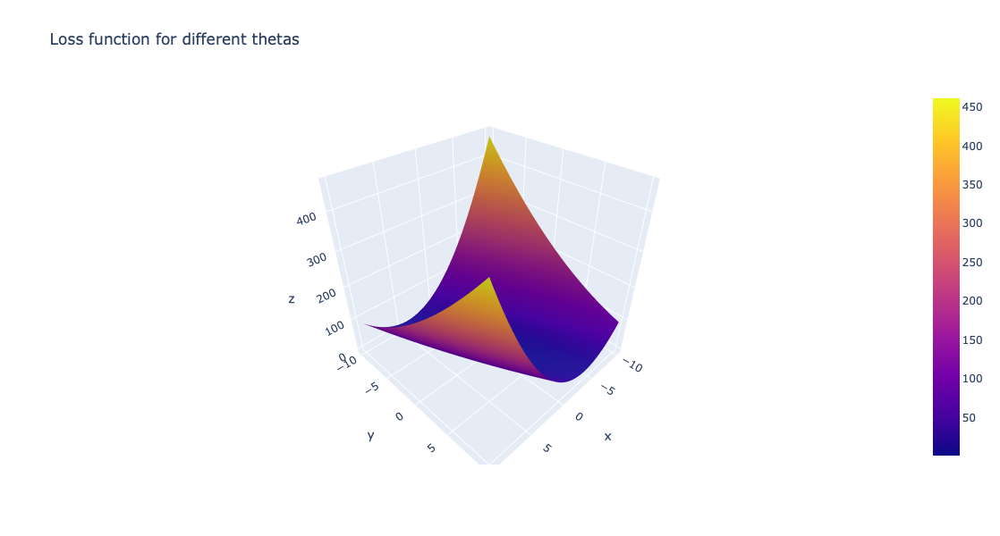

In [972]:
# Showing the loss function
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### Madrid 1990

In [974]:
# Reducing the dataset to a single year
climatewins_madrid_1990 = climatewins_reduced[climatewins_reduced['DATE'].astype(str).str.contains('1990')]

In [975]:
# Checking if the reduction was successful 
climatewins_madrid_1990

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
10958,19900101,-1.599964,-1.696559,-1.584333,-1.369721,-1.506712,-1.490139,-1.298463,-1.172216,-1.541424,-1.479805,-1.447359,-0.974801,-1.811529,-1.594218,-1.937140,-0.460708,-1.274353,-1.528019,-1.148890
10959,19900102,-1.599964,-1.655817,-1.538937,-1.428538,-1.427601,-1.269240,-1.081061,-1.049918,-1.452825,-1.528241,-1.342338,-1.136550,-1.522480,-1.497139,-1.566700,-0.782460,-1.448521,-1.292705,-1.028721
10960,19900103,-1.599964,-1.710140,-1.527588,-1.440302,-1.301023,-1.460686,-1.196156,-1.259573,-1.570958,-1.382933,-1.387347,-1.069155,-1.359104,-1.703431,-1.600376,-0.972586,-1.361437,-1.261329,-0.878510
10961,19900104,-1.599964,-1.506430,-1.788618,-1.616753,-1.538357,-1.401779,-1.515865,-1.032446,-1.570958,-1.516132,-1.642398,-1.136550,-1.710990,-1.023880,-1.583538,-1.001836,-0.938458,-1.386830,-1.269058
10962,19900105,-1.599964,-1.411366,-2.083696,-1.687333,-1.063690,-1.107247,-1.592595,-0.805320,-1.408526,-1.794639,-1.237316,-1.082634,-1.447075,-0.878261,-1.886626,-0.870210,-0.963339,-1.135828,-0.397835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11318,19901227,1.594371,-0.515042,-1.005527,-1.299141,-0.589023,-0.842167,-0.786929,-0.945090,-0.832631,-1.177080,-0.772222,-0.840010,-0.491955,-0.659834,-1.246774,-0.943336,-0.453275,-0.712262,-0.998679
11319,19901228,1.594371,-0.895301,-1.107669,-1.169744,-0.810534,-0.753808,-0.825294,-0.648078,-1.024596,-1.092317,-0.862240,-0.907406,-1.057487,-0.805452,-1.263612,-1.338213,-0.639884,-0.759325,-0.788384
11320,19901229,1.594371,-0.012558,-1.289256,-1.463829,-0.240934,-0.400369,-0.850871,-0.648078,-0.463468,-1.080208,-0.247115,-0.853490,-0.077232,-0.684104,-1.566700,-0.723959,-0.565240,-0.100445,-1.899944
11321,19901230,1.594371,0.218313,-0.937432,-1.263851,-0.604845,-0.503455,-0.659045,-0.857734,-0.611133,-0.801701,-0.532173,-0.893927,-0.240607,-1.145228,-0.960524,-0.007330,-0.602562,-0.382822,-1.779775


In [976]:
# Checking the dimensions
climatewins_madrid_1990.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,1.990067e+07,0.004762,0.070861,0.043663,0.027964,0.139493,0.146131,0.150405,0.152728,0.104417,-0.001047,0.095736,0.063753,0.003406,0.144391,0.038743,0.037507,0.131603,0.137621,0.135022
std,3.454755e+02,1.002610,0.901173,0.898311,0.906770,0.839960,0.882042,0.756431,0.942064,0.930487,0.911890,0.885778,1.023386,0.923807,0.825958,1.130786,0.866875,0.789326,0.980101,1.096645
min,1.990010e+07,-1.599964,-1.818785,-2.537662,-2.357847,-1.633290,-1.607952,-1.592595,-1.888539,-1.748156,-2.266890,-1.747420,-1.743109,-2.490168,-1.933994,-2.088684,-2.435095,-1.572927,-2.139837,-2.290492
25%,1.990040e+07,-0.728781,-0.582946,-0.631005,-0.640390,-0.525734,-0.532908,-0.518374,-0.630607,-0.625900,-0.704829,-0.607188,-0.799573,-0.680466,-0.477811,-0.893171,-0.519208,-0.552800,-0.649512,-0.788384
50%,1.990070e+07,0.142401,0.109668,0.152086,0.077177,0.154622,0.173970,0.172198,0.138129,0.082894,-0.002507,0.097955,-0.112140,0.073577,0.080392,-0.051261,0.109671,0.081670,0.150558,0.142923
75%,1.990100e+07,1.013583,0.734378,0.708194,0.724164,0.708400,0.763035,0.786039,0.802037,0.762154,0.663488,0.683074,0.993146,0.701946,0.857022,1.026385,0.665425,0.828105,0.856501,0.863935
max,1.990123e+07,1.594371,1.997379,1.740967,1.876978,2.417201,2.765857,1.898625,2.828705,2.475072,1.801735,2.603464,2.165827,1.946116,1.767136,2.019839,1.879307,1.985078,2.644891,2.966887


In [977]:
# Dropping the DATE and MONTH data as those numbers are not scaled with the rest (NO MEANS in those columns)
notempyear_madrid_1990 = climatewins_madrid_1990.drop(['DATE','MONTH'], axis=1)

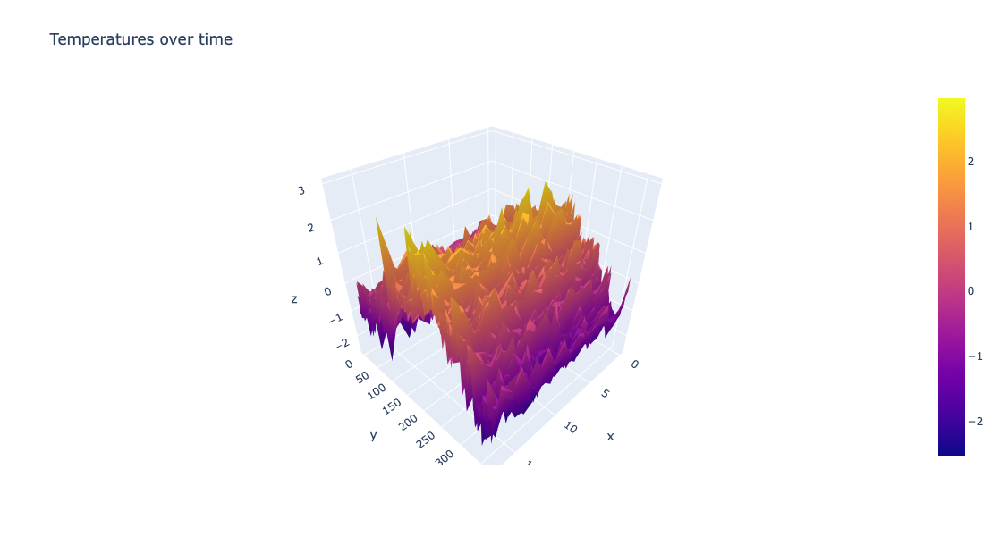

In [978]:
# Plotting ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate it

fig = go.Figure(data=[go.Surface(z=notempyear_madrid_1990.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [979]:
# Creating a set of data from 1 to 365 (or to 366 if it's a leap year!)
# Scaling this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [980]:
# Checking the number of rows
n_rows_madrid_1990 = climatewins_madrid_1990.shape[0]
n_rows_madrid_1990

365

In [981]:
# Translating the chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows_madrid_1990,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows_madrid_1990,1))
X = np.concatenate((ones, X), axis=1)
y=climatewins_madrid_1990['MADRID_temp_mean'].to_numpy().reshape(n_rows_madrid_1990,1) # MADRID weather station chosen

In [982]:
# Checking the dimensions of X and Y 
X.shape, y.shape

((365, 2), (365, 1))

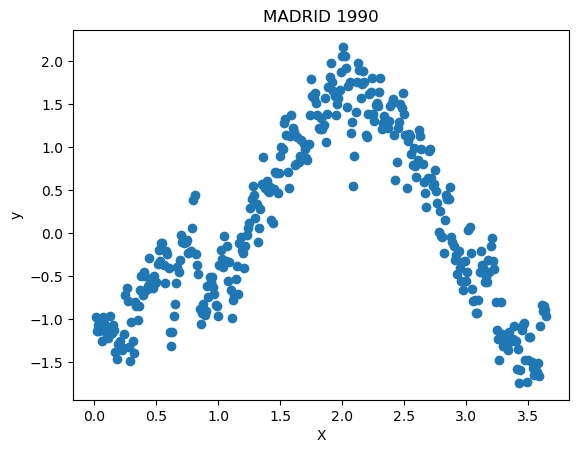

In [983]:
# Looking at one year of temperature data over time
plt.scatter(x=index['index'], y=climatewins_madrid_1990['MADRID_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('MADRID 1990');

# Displaying the visualization
plt.show()

In [984]:
# Checking the MINIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_madrid_1990['MADRID_temp_mean'].min()

-1.743109449208083

In [985]:
# Checking the MAXIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_madrid_1990['MADRID_temp_mean'].max()

2.1658266305512592

In [986]:
# Computing the LOSS function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [987]:
# Computing the cost
compute_cost(X,y)

array([0.52425693])

In [988]:
# This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [989]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.02 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 453 ms, sys: 5.23 ms, total: 458 ms
Wall time: 155 ms


In [990]:
theta

array([[-0.12038745],
       [ 0.10281342]])

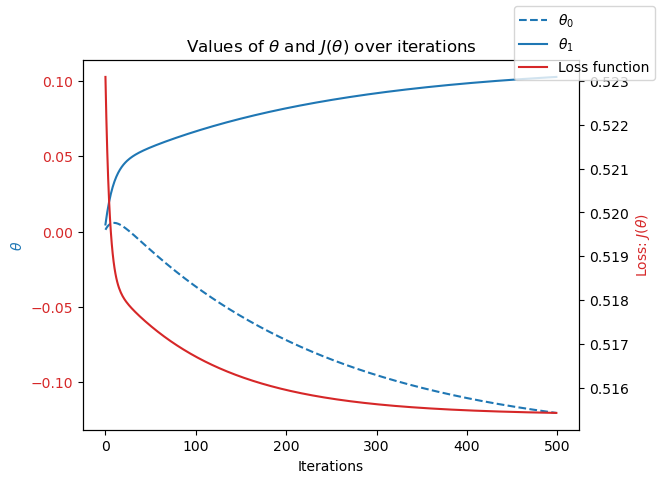

In [991]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

# Displaying the visualization
plt.show()

In [992]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.46 s, sys: 33.3 ms, total: 1.49 s
Wall time: 1.05 s


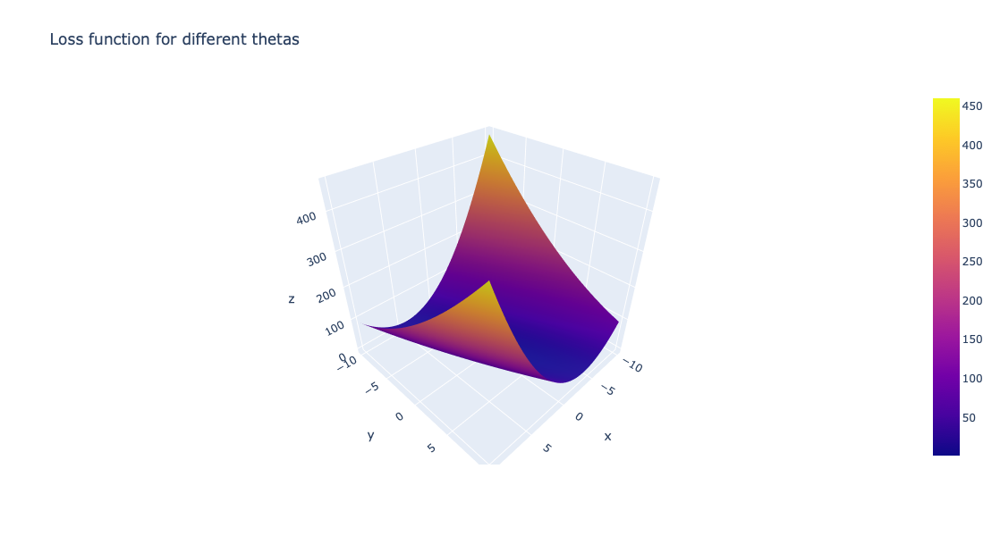

In [993]:
# Showing the loss function
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### Madrid 2020

In [995]:
# Reducing the dataset to a single year
climatewins_madrid_2020 = climatewins_reduced[climatewins_reduced['DATE'].astype(str).str.startswith('2020')]

In [996]:
# Checking if the reduction was successful 
climatewins_madrid_2020

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
21915,20200101,-1.599964,-1.465688,-1.209812,-0.934476,-1.459245,-1.387053,-0.735776,-1.102331,-0.005705,-1.370824,-1.612392,-1.123071,-1.032352,-0.550620,-0.000746,-0.153581,-0.478156,-0.869139,-0.007287
21916,20200102,-1.599964,-1.397785,-1.141717,-1.169744,-0.968756,-1.225060,-0.953178,-0.595665,-0.005705,-1.625113,-0.997267,-1.203946,-1.321402,-0.283654,-0.000746,-0.051205,-0.192023,-0.414197,-0.007287
21917,20200103,-1.599964,-0.691591,-1.357351,-1.569699,-0.383334,-0.444548,-0.799717,-0.386009,-0.005705,-1.419260,-0.397145,-1.500486,-0.693033,-0.235114,-0.000746,0.007295,-0.241785,-0.288696,-0.007287
21918,20200104,-1.599964,-0.596526,-1.504889,-1.063873,-0.525734,-0.827441,-0.556739,-0.980032,-0.005705,-1.104426,-0.772222,-1.069155,-0.592494,-0.696239,-0.000746,-0.694709,-0.615003,-0.978952,-0.007287
21919,20200105,-1.599964,-1.180494,-1.050924,-1.040346,-0.494089,-0.635995,-0.722987,-0.648078,-0.005705,-1.225516,-0.637194,-1.176988,-0.818707,-0.793317,-0.000746,-1.382089,-0.901136,-0.822076,-0.007287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,20201227,1.594371,-1.180494,-1.130368,-1.369721,-0.794712,-0.871621,-1.017119,-0.875205,-0.005705,-1.382933,-0.877243,-1.635277,-1.396806,-0.429272,-0.000746,-1.148087,-0.391072,-0.947577,-0.007287
22277,20201228,1.594371,-0.786655,-0.528863,-0.863895,-1.016223,-0.945254,-0.710199,-1.783711,-0.005705,-1.261843,-1.087286,-1.244383,-1.095189,-0.623429,-0.000746,-1.177337,-0.391072,-1.135828,-0.007287
22278,20201229,1.594371,-0.813817,-0.131643,-0.346305,-1.000401,-1.357599,-0.480009,-1.539113,-0.005705,-0.947009,-1.207310,-1.406132,-0.781005,-0.502081,-0.000746,-1.235838,-0.366191,-1.041702,-0.007287
22279,20201230,1.594371,-1.058269,-0.052199,-0.499230,-0.921290,-1.048340,-0.838082,-1.521642,-0.005705,-0.934900,-1.012270,-1.365695,-0.856409,-0.574890,-0.000746,-1.279713,-0.565240,-1.120141,-0.007287


In [997]:
# Checking the dimensions
climatewins_madrid_2020.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,366.000000,366.000000,3.660000e+02
mean,2.020067e+07,0.001171,0.236087,0.191498,0.172345,0.263519,0.226841,0.246097,0.241620,-5.705221e-03,0.170559,0.279836,0.145252,0.250035,0.275909,-7.461638e-04,0.256961,0.295811,0.319435,-7.287352e-03
std,3.457653e+02,1.003590,0.934854,0.915643,0.923699,0.880960,0.905961,0.815164,0.974223,4.777020e-17,0.916080,0.913584,1.003402,0.875189,0.783143,4.451314e-18,0.888164,0.788996,0.922377,4.603310e-17
min,2.020010e+07,-1.599964,-1.682979,-1.629730,-1.581463,-1.490890,-1.607952,-1.336828,-2.115665,-5.705221e-03,-1.625113,-1.732417,-1.635277,-1.434508,-1.290846,-7.461638e-04,-2.113343,-1.075304,-1.543707,-7.287352e-03
25%,2.020040e+07,-0.728781,-0.552389,-0.560073,-0.590396,-0.430800,-0.503455,-0.425658,-0.508308,-5.705221e-03,-0.644284,-0.427152,-0.637824,-0.476246,-0.356463,-7.461638e-04,-0.292519,-0.328869,-0.414197,-7.287352e-03
50%,2.020070e+07,0.142401,0.238684,0.237205,0.177166,0.233733,0.173970,0.140227,0.103186,-5.705221e-03,0.209401,0.232983,-0.091921,0.293506,0.110729,-7.461638e-04,0.248609,0.112771,0.323121,-7.287352e-03
75%,2.020098e+07,0.940984,0.978830,0.986248,0.947669,0.898267,0.851395,0.949090,1.029164,-5.705221e-03,0.923832,0.949378,0.996516,0.953293,0.866124,-7.461638e-04,0.914051,0.949400,0.966314,-7.287352e-03
max,2.020123e+07,1.594371,2.309734,1.945251,1.935795,2.686179,2.500777,2.039297,3.038360,-5.705221e-03,1.934934,2.783501,2.327576,2.147194,2.203991,-7.461638e-04,2.230310,2.159246,2.660579,-7.287352e-03


In [998]:
# Dropping the DATE and MONTH data as those numbers are not scaled with the rest (NO MEANS in those columns)
notempyear_madrid_2020 = climatewins_madrid_2020.drop(['DATE','MONTH'], axis=1)

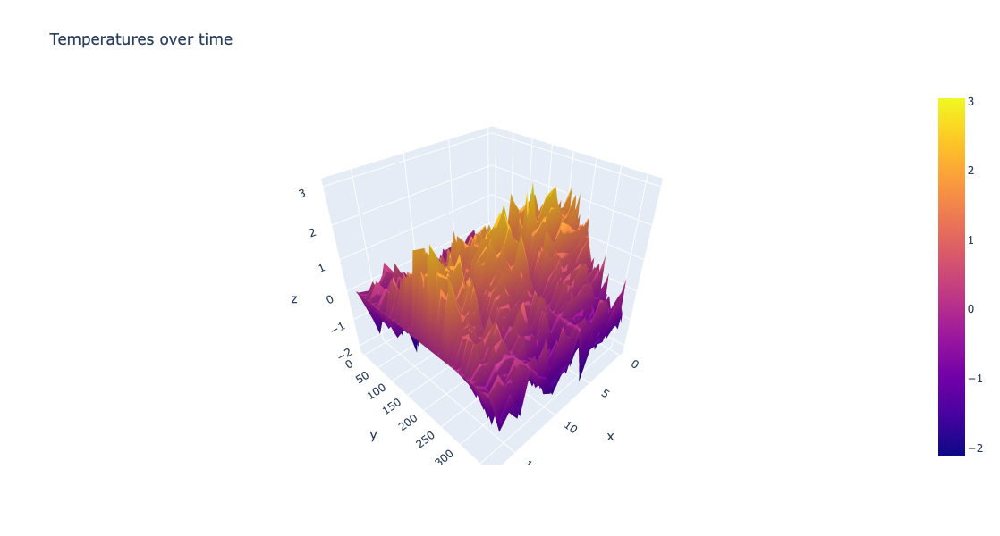

In [999]:
# Plotting ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate it

fig = go.Figure(data=[go.Surface(z=notempyear_madrid_2020.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [1000]:
# Creating a set of data from 1 to 365 (or to 366 if it's a leap year!)
# Scaling this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [1001]:
# Checking the number of rows
n_rows_madrid_2020 = climatewins_madrid_2020.shape[0]
n_rows_madrid_2020

366

In [1002]:
# Translating the chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows_madrid_2020,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows_madrid_2020,1))
X = np.concatenate((ones, X), axis=1)
y=climatewins_madrid_2020['MADRID_temp_mean'].to_numpy().reshape(n_rows_madrid_2020,1) # MADRID weather station chosen

In [1003]:
# Checking the dimensions of X and Y 
X.shape, y.shape

((366, 2), (366, 1))

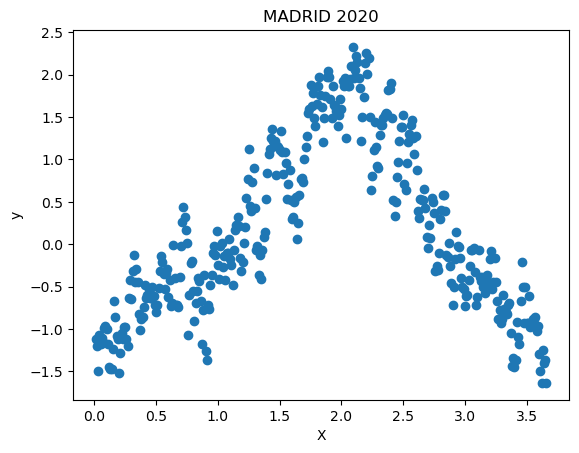

In [1004]:
# Looking at one year of temperature data over time
plt.scatter(x=index['index'], y=climatewins_madrid_2020['MADRID_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('MADRID 2020');

# Displaying the visualization
plt.show()

In [1005]:
# Checking the MINIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_madrid_2020['MADRID_temp_mean'].min()

-1.635276729766446

In [1006]:
# Checking the MAXIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_madrid_2020['MADRID_temp_mean'].max()

2.3275757097137153

In [1007]:
# Computing the LOSS function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [1008]:
# Computing the cost
compute_cost(X,y)

array([0.5125818])

In [1009]:
# This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [1010]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=200 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 182 ms, sys: 761 μs, total: 182 ms
Wall time: 60.6 ms


In [1011]:
theta

array([[-0.0609547 ],
       [ 0.11381949]])

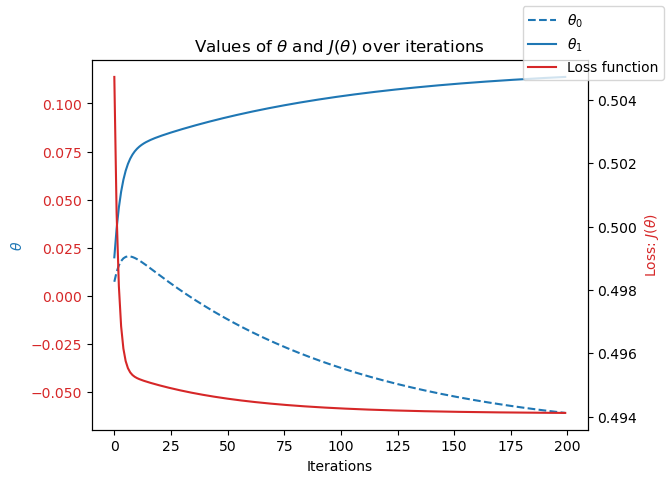

In [1012]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

# Displaying the visualization
plt.show()

In [1013]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.43 s, sys: 35.9 ms, total: 1.47 s
Wall time: 1.04 s


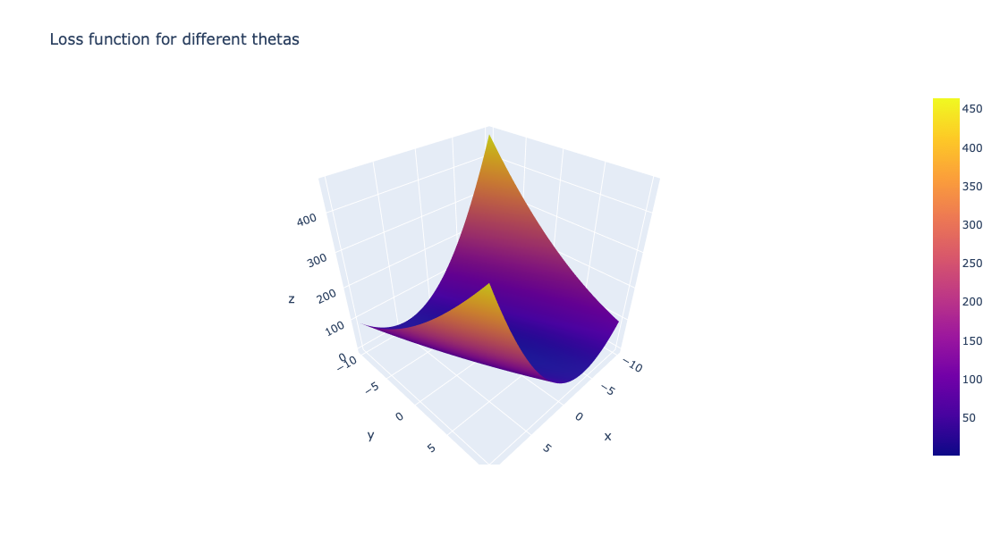

In [1014]:
# Showing the loss function
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### Stockholm 1960

In [1016]:
# Reducing the dataset to a single year
climatewins_stockholm_1960 = climatewins_reduced[climatewins_reduced['DATE'].astype(str).str.contains('1960')]

In [1017]:
# Checking if the reduction was successful 
climatewins_stockholm_1960

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,-1.599964,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,-1.599964,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,-1.599964,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,-1.599964,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,-1.599964,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,19601227,1.594371,-1.289140,-1.277907,-1.440302,-1.126979,-0.974707,-0.940389,-1.469228,-0.891697,-1.721985,-0.997267,-1.069155,-1.120324,-0.417137,-1.785596,-0.914086,-0.403513,-1.104453,-1.629564
362,19601228,1.594371,-1.289140,-1.255208,-1.416775,-1.522534,-1.283966,-0.978754,-1.469228,-1.054129,-1.479805,-1.342338,-1.338737,-1.321402,-0.550620,-1.381479,-1.279713,-0.565240,-1.653520,-1.509396
363,19601229,1.594371,-1.207656,-1.221161,-1.122690,-1.570001,-1.313420,-1.234521,-1.434286,-1.305160,-1.443478,-1.342338,-0.920885,-1.459643,-0.708373,-1.819273,-1.659965,-0.615003,-1.073078,-0.998679
364,19601230,1.594371,-1.547172,-1.243859,-1.169744,-1.316845,-1.372326,-0.889236,-1.084860,-1.393759,-1.273952,-1.177304,-0.772615,-1.547614,-0.829722,-1.549861,-1.674591,-0.726968,-0.900514,-1.239016


In [1018]:
# Checking the dimensions
climatewins_stockholm_1960.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,1.960067e+07,0.001171,-0.102317,-0.032384,-0.063919,-0.052666,-0.034416,-0.067706,-0.103366,0.026208,-0.074499,-0.063840,-0.130480,-0.101680,-0.078422,0.092554,-0.175958,-0.092804,-0.059940,-0.057276
std,3.457653e+02,1.003590,0.935826,0.920271,0.946637,0.910451,0.919531,0.978767,0.919195,0.964448,0.906193,0.902235,0.979590,0.938523,0.998018,1.002362,0.884235,0.988702,0.944029,1.127911
min,1.960010e+07,-1.599964,-3.190431,-2.401472,-2.416664,-2.645913,-2.874442,-2.922584,-2.307849,-3.446307,-2.714923,-3.247725,-2.322710,-3.017997,-2.249500,-2.408610,-3.502727,-2.356684,-3.112470,-2.951420
25%,1.960040e+07,-0.728781,-0.756099,-0.594120,-0.675681,-0.668134,-0.661766,-0.825294,-0.840262,-0.666507,-0.738129,-0.712209,-0.890557,-0.777863,-0.738711,-0.653227,-0.764178,-0.798501,-0.692653,-0.848468
50%,1.960070e+07,0.142401,-0.053300,0.055618,-0.005167,-0.011511,-0.002750,-0.096358,-0.071526,0.082894,-0.002507,0.052946,-0.294107,-0.001827,-0.168373,-0.009165,-0.124331,-0.179582,0.032900,-0.037330
75%,1.960098e+07,0.940984,0.649499,0.662798,0.744750,0.692578,0.715174,0.757265,0.714681,0.802762,0.699815,0.649317,0.787590,0.626541,0.869157,1.110576,0.475298,0.877867,0.683937,0.893978
max,1.960123e+07,1.594371,1.820830,1.843109,1.806397,1.847601,1.970619,1.834684,1.745486,2.002543,1.668536,1.688278,1.936682,1.858144,1.985564,1.952486,1.967058,1.686504,1.938947,2.606381


In [1019]:
# Dropping the DATE and MONTH data as those numbers are not scaled with the rest (NO MEANS in those columns)
notempyear_stockholm_1960 = climatewins_stockholm_1960.drop(['DATE','MONTH'], axis=1)

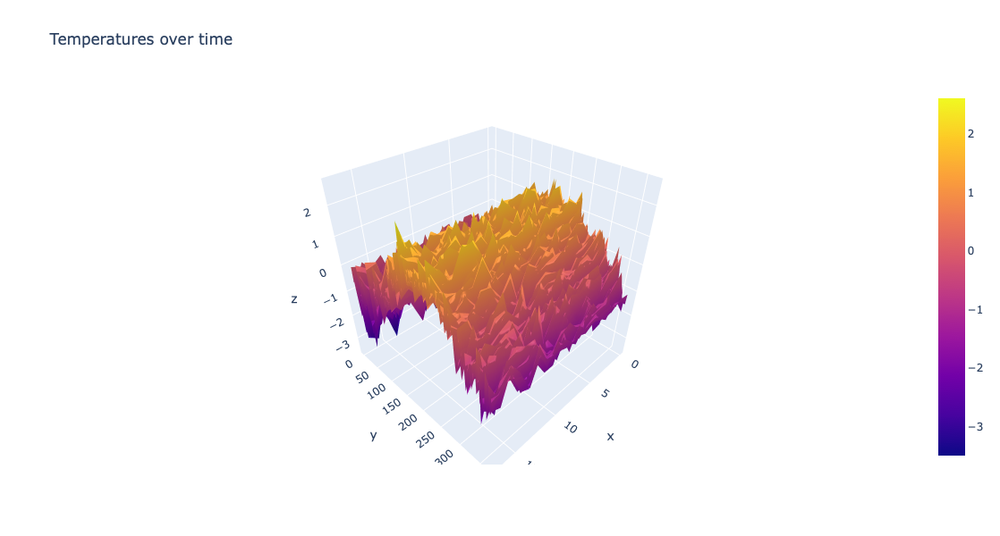

In [1020]:
# Plotting ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate it

fig = go.Figure(data=[go.Surface(z=notempyear_stockholm_1960.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [1021]:
# Creating a set of data from 1 to 365 (or to 366 if it's a leap year!)
# Scaling this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [1022]:
# Checking the number of rows
n_rows_stockholm_1960 = climatewins_stockholm_1960.shape[0]
n_rows_stockholm_1960

366

In [1023]:
# Translating the chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows_stockholm_1960,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows_stockholm_1960,1))
X = np.concatenate((ones, X), axis=1)
y=climatewins_stockholm_1960['STOCKHOLM_temp_mean'].to_numpy().reshape(n_rows_stockholm_1960,1) # STOCKHOLM weather station chosen

In [1024]:
# Checking the dimensions of X and Y 
X.shape, y.shape

((366, 2), (366, 1))

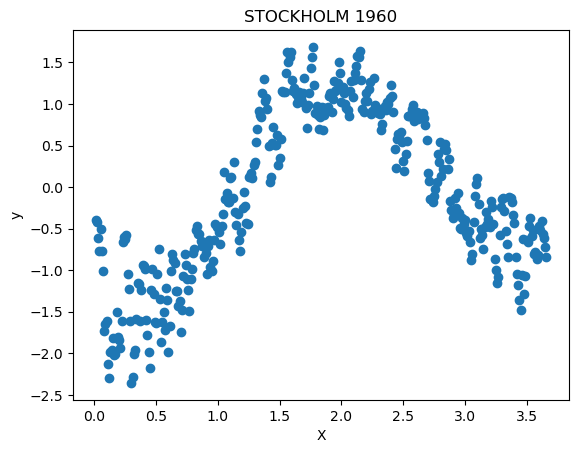

In [1025]:
# Looking at one year of temperature data over time
plt.scatter(x=index['index'], y=climatewins_stockholm_1960['STOCKHOLM_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('STOCKHOLM 1960');

# Displaying the visualization
plt.show()

In [1026]:
# Checking the MINIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_stockholm_1960['STOCKHOLM_temp_mean'].min()

-2.356683584001993

In [1027]:
# Checking the MAXIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_stockholm_1960['STOCKHOLM_temp_mean'].max()

1.6865044645383225

In [1028]:
# Computing the LOSS function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [1029]:
# Computing the cost
compute_cost(X,y)

array([0.49173644])

In [1030]:
# This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [1031]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=150 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 141 ms, sys: 1.57 ms, total: 142 ms
Wall time: 47 ms


In [1032]:
theta

array([[-0.65669454],
       [ 0.31053287]])

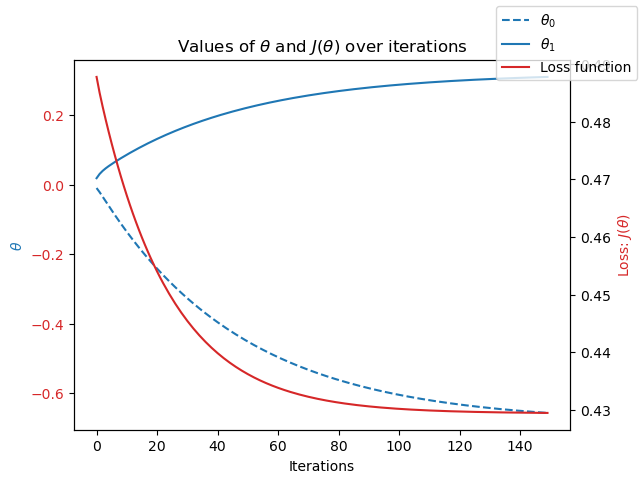

In [1033]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

# Displaying the visualization
plt.show()

In [1034]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.42 s, sys: 34.1 ms, total: 1.45 s
Wall time: 1.02 s


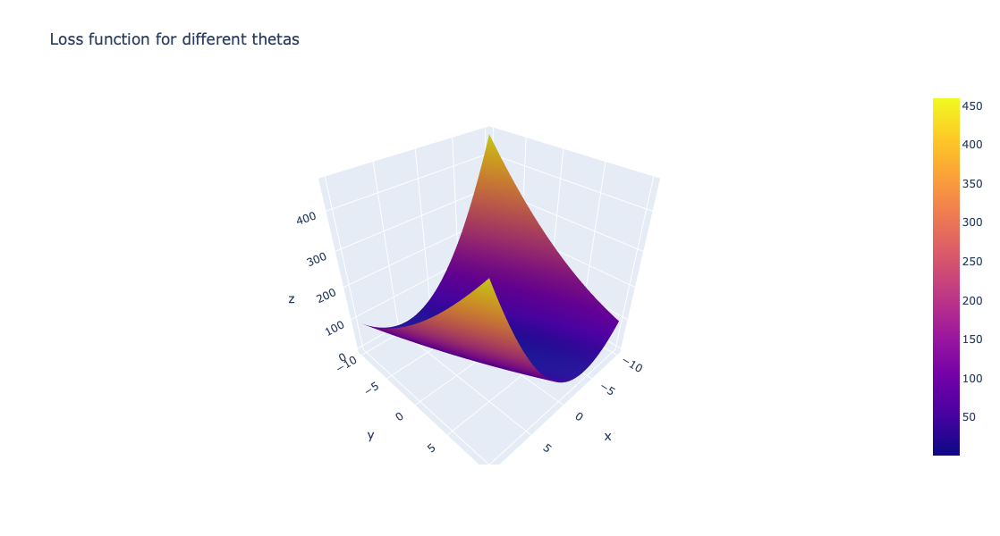

In [1035]:
# Showing the loss function
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### Stockholm 1990

In [1037]:
# Reducing the dataset to a single year
climatewins_stockholm_1990 = climatewins_reduced[climatewins_reduced['DATE'].astype(str).str.contains('1990')]

In [1038]:
# Checking if the reduction was successful 
climatewins_stockholm_1990

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
10958,19900101,-1.599964,-1.696559,-1.584333,-1.369721,-1.506712,-1.490139,-1.298463,-1.172216,-1.541424,-1.479805,-1.447359,-0.974801,-1.811529,-1.594218,-1.937140,-0.460708,-1.274353,-1.528019,-1.148890
10959,19900102,-1.599964,-1.655817,-1.538937,-1.428538,-1.427601,-1.269240,-1.081061,-1.049918,-1.452825,-1.528241,-1.342338,-1.136550,-1.522480,-1.497139,-1.566700,-0.782460,-1.448521,-1.292705,-1.028721
10960,19900103,-1.599964,-1.710140,-1.527588,-1.440302,-1.301023,-1.460686,-1.196156,-1.259573,-1.570958,-1.382933,-1.387347,-1.069155,-1.359104,-1.703431,-1.600376,-0.972586,-1.361437,-1.261329,-0.878510
10961,19900104,-1.599964,-1.506430,-1.788618,-1.616753,-1.538357,-1.401779,-1.515865,-1.032446,-1.570958,-1.516132,-1.642398,-1.136550,-1.710990,-1.023880,-1.583538,-1.001836,-0.938458,-1.386830,-1.269058
10962,19900105,-1.599964,-1.411366,-2.083696,-1.687333,-1.063690,-1.107247,-1.592595,-0.805320,-1.408526,-1.794639,-1.237316,-1.082634,-1.447075,-0.878261,-1.886626,-0.870210,-0.963339,-1.135828,-0.397835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11318,19901227,1.594371,-0.515042,-1.005527,-1.299141,-0.589023,-0.842167,-0.786929,-0.945090,-0.832631,-1.177080,-0.772222,-0.840010,-0.491955,-0.659834,-1.246774,-0.943336,-0.453275,-0.712262,-0.998679
11319,19901228,1.594371,-0.895301,-1.107669,-1.169744,-0.810534,-0.753808,-0.825294,-0.648078,-1.024596,-1.092317,-0.862240,-0.907406,-1.057487,-0.805452,-1.263612,-1.338213,-0.639884,-0.759325,-0.788384
11320,19901229,1.594371,-0.012558,-1.289256,-1.463829,-0.240934,-0.400369,-0.850871,-0.648078,-0.463468,-1.080208,-0.247115,-0.853490,-0.077232,-0.684104,-1.566700,-0.723959,-0.565240,-0.100445,-1.899944
11321,19901230,1.594371,0.218313,-0.937432,-1.263851,-0.604845,-0.503455,-0.659045,-0.857734,-0.611133,-0.801701,-0.532173,-0.893927,-0.240607,-1.145228,-0.960524,-0.007330,-0.602562,-0.382822,-1.779775


In [1039]:
# Checking the dimensions
climatewins_stockholm_1990.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,1.990067e+07,0.004762,0.070861,0.043663,0.027964,0.139493,0.146131,0.150405,0.152728,0.104417,-0.001047,0.095736,0.063753,0.003406,0.144391,0.038743,0.037507,0.131603,0.137621,0.135022
std,3.454755e+02,1.002610,0.901173,0.898311,0.906770,0.839960,0.882042,0.756431,0.942064,0.930487,0.911890,0.885778,1.023386,0.923807,0.825958,1.130786,0.866875,0.789326,0.980101,1.096645
min,1.990010e+07,-1.599964,-1.818785,-2.537662,-2.357847,-1.633290,-1.607952,-1.592595,-1.888539,-1.748156,-2.266890,-1.747420,-1.743109,-2.490168,-1.933994,-2.088684,-2.435095,-1.572927,-2.139837,-2.290492
25%,1.990040e+07,-0.728781,-0.582946,-0.631005,-0.640390,-0.525734,-0.532908,-0.518374,-0.630607,-0.625900,-0.704829,-0.607188,-0.799573,-0.680466,-0.477811,-0.893171,-0.519208,-0.552800,-0.649512,-0.788384
50%,1.990070e+07,0.142401,0.109668,0.152086,0.077177,0.154622,0.173970,0.172198,0.138129,0.082894,-0.002507,0.097955,-0.112140,0.073577,0.080392,-0.051261,0.109671,0.081670,0.150558,0.142923
75%,1.990100e+07,1.013583,0.734378,0.708194,0.724164,0.708400,0.763035,0.786039,0.802037,0.762154,0.663488,0.683074,0.993146,0.701946,0.857022,1.026385,0.665425,0.828105,0.856501,0.863935
max,1.990123e+07,1.594371,1.997379,1.740967,1.876978,2.417201,2.765857,1.898625,2.828705,2.475072,1.801735,2.603464,2.165827,1.946116,1.767136,2.019839,1.879307,1.985078,2.644891,2.966887


In [1040]:
# Dropping the DATE and MONTH data as those numbers are not scaled with the rest (NO MEANS in those columns)
notempyear_stockholm_1990 = climatewins_stockholm_1990.drop(['DATE','MONTH'], axis=1)

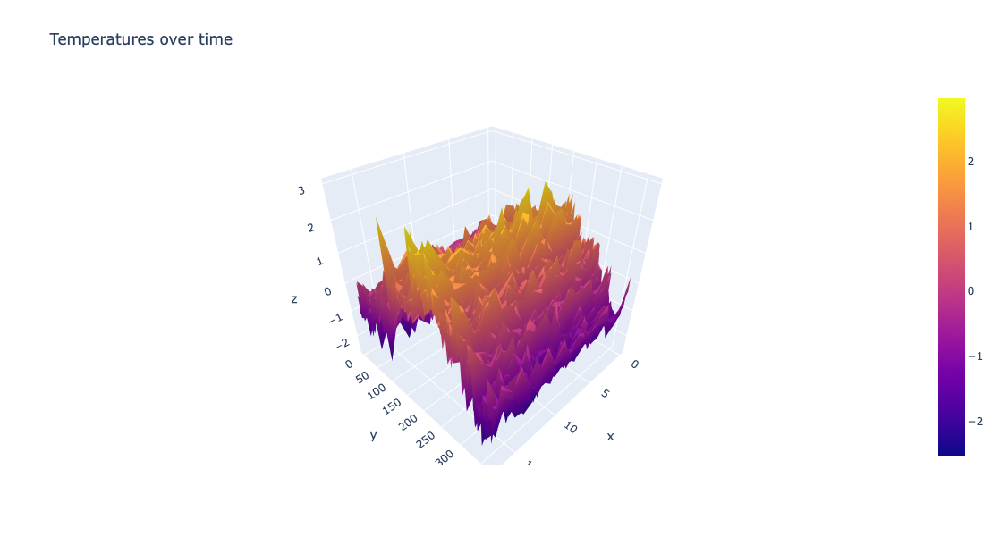

In [1041]:
# Plotting ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate it

fig = go.Figure(data=[go.Surface(z=notempyear_stockholm_1990.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [1042]:
# Creating a set of data from 1 to 365 (or to 366 if it's a leap year!)
# Scaling this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [1043]:
# Checking the number of rows
n_rows_stockholm_1990 = climatewins_stockholm_1990.shape[0]
n_rows_stockholm_1990

365

In [1044]:
# Translating the chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows_stockholm_1990,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows_stockholm_1990,1))
X = np.concatenate((ones, X), axis=1)
y=climatewins_stockholm_1990['STOCKHOLM_temp_mean'].to_numpy().reshape(n_rows_stockholm_1990,1) # STOCKHOLM weather station chosen

In [1045]:
# Checking the dimensions of X and Y 
X.shape, y.shape

((365, 2), (365, 1))

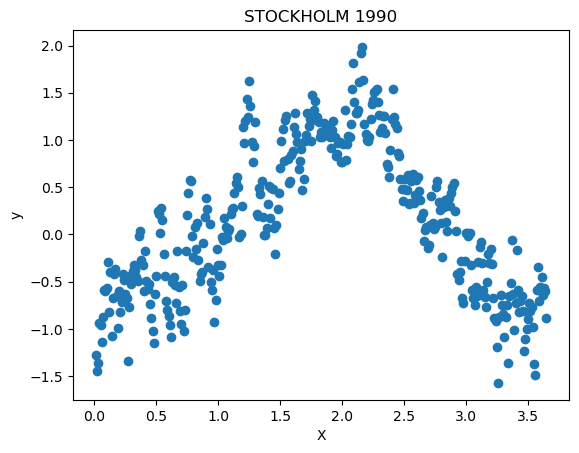

In [1046]:
# Looking at one year of temperature data over time
plt.scatter(x=index['index'], y=climatewins_stockholm_1990['STOCKHOLM_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('STOCKHOLM 1990');

# Displaying the visualization
plt.show()

In [1047]:
# Checking the MINIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_stockholm_1990['STOCKHOLM_temp_mean'].min()

-1.5729271315157165

In [1048]:
# Checking the MAXIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_stockholm_1990['STOCKHOLM_temp_mean'].max()

1.9850783511997612

In [1049]:
# Computing the LOSS function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [1050]:
# Computing the cost
compute_cost(X,y)

array([0.3193237])

In [1051]:
# This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [1052]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=100 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.01 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 82 ms, sys: 1.21 ms, total: 83.3 ms
Wall time: 31.3 ms


In [1053]:
theta

array([[0.02980705],
       [0.05230967]])

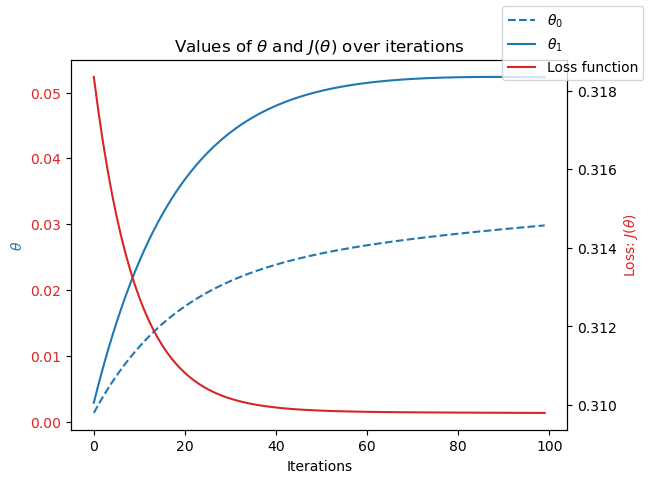

In [1054]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

# Displaying the visualization
plt.show()

In [1055]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.44 s, sys: 36.1 ms, total: 1.48 s
Wall time: 1.04 s


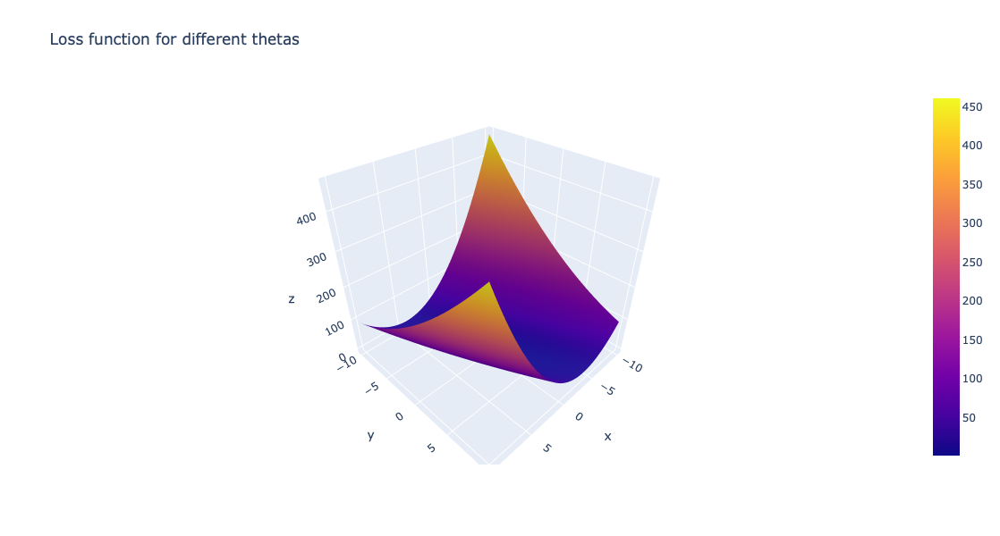

In [1056]:
# Showing the loss function
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### Stockholm 2020

In [1058]:
# Reducing the dataset to a single year
climatewins_stockholm_2020 = climatewins_reduced[climatewins_reduced['DATE'].astype(str).str.startswith('2020')]

In [1059]:
# Checking if the reduction was successful 
climatewins_stockholm_2020

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
21915,20200101,-1.599964,-1.465688,-1.209812,-0.934476,-1.459245,-1.387053,-0.735776,-1.102331,-0.005705,-1.370824,-1.612392,-1.123071,-1.032352,-0.550620,-0.000746,-0.153581,-0.478156,-0.869139,-0.007287
21916,20200102,-1.599964,-1.397785,-1.141717,-1.169744,-0.968756,-1.225060,-0.953178,-0.595665,-0.005705,-1.625113,-0.997267,-1.203946,-1.321402,-0.283654,-0.000746,-0.051205,-0.192023,-0.414197,-0.007287
21917,20200103,-1.599964,-0.691591,-1.357351,-1.569699,-0.383334,-0.444548,-0.799717,-0.386009,-0.005705,-1.419260,-0.397145,-1.500486,-0.693033,-0.235114,-0.000746,0.007295,-0.241785,-0.288696,-0.007287
21918,20200104,-1.599964,-0.596526,-1.504889,-1.063873,-0.525734,-0.827441,-0.556739,-0.980032,-0.005705,-1.104426,-0.772222,-1.069155,-0.592494,-0.696239,-0.000746,-0.694709,-0.615003,-0.978952,-0.007287
21919,20200105,-1.599964,-1.180494,-1.050924,-1.040346,-0.494089,-0.635995,-0.722987,-0.648078,-0.005705,-1.225516,-0.637194,-1.176988,-0.818707,-0.793317,-0.000746,-1.382089,-0.901136,-0.822076,-0.007287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,20201227,1.594371,-1.180494,-1.130368,-1.369721,-0.794712,-0.871621,-1.017119,-0.875205,-0.005705,-1.382933,-0.877243,-1.635277,-1.396806,-0.429272,-0.000746,-1.148087,-0.391072,-0.947577,-0.007287
22277,20201228,1.594371,-0.786655,-0.528863,-0.863895,-1.016223,-0.945254,-0.710199,-1.783711,-0.005705,-1.261843,-1.087286,-1.244383,-1.095189,-0.623429,-0.000746,-1.177337,-0.391072,-1.135828,-0.007287
22278,20201229,1.594371,-0.813817,-0.131643,-0.346305,-1.000401,-1.357599,-0.480009,-1.539113,-0.005705,-0.947009,-1.207310,-1.406132,-0.781005,-0.502081,-0.000746,-1.235838,-0.366191,-1.041702,-0.007287
22279,20201230,1.594371,-1.058269,-0.052199,-0.499230,-0.921290,-1.048340,-0.838082,-1.521642,-0.005705,-0.934900,-1.012270,-1.365695,-0.856409,-0.574890,-0.000746,-1.279713,-0.565240,-1.120141,-0.007287


In [1060]:
# Checking the dimensions
climatewins_stockholm_2020.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,366.000000,366.000000,3.660000e+02
mean,2.020067e+07,0.001171,0.236087,0.191498,0.172345,0.263519,0.226841,0.246097,0.241620,-5.705221e-03,0.170559,0.279836,0.145252,0.250035,0.275909,-7.461638e-04,0.256961,0.295811,0.319435,-7.287352e-03
std,3.457653e+02,1.003590,0.934854,0.915643,0.923699,0.880960,0.905961,0.815164,0.974223,4.777020e-17,0.916080,0.913584,1.003402,0.875189,0.783143,4.451314e-18,0.888164,0.788996,0.922377,4.603310e-17
min,2.020010e+07,-1.599964,-1.682979,-1.629730,-1.581463,-1.490890,-1.607952,-1.336828,-2.115665,-5.705221e-03,-1.625113,-1.732417,-1.635277,-1.434508,-1.290846,-7.461638e-04,-2.113343,-1.075304,-1.543707,-7.287352e-03
25%,2.020040e+07,-0.728781,-0.552389,-0.560073,-0.590396,-0.430800,-0.503455,-0.425658,-0.508308,-5.705221e-03,-0.644284,-0.427152,-0.637824,-0.476246,-0.356463,-7.461638e-04,-0.292519,-0.328869,-0.414197,-7.287352e-03
50%,2.020070e+07,0.142401,0.238684,0.237205,0.177166,0.233733,0.173970,0.140227,0.103186,-5.705221e-03,0.209401,0.232983,-0.091921,0.293506,0.110729,-7.461638e-04,0.248609,0.112771,0.323121,-7.287352e-03
75%,2.020098e+07,0.940984,0.978830,0.986248,0.947669,0.898267,0.851395,0.949090,1.029164,-5.705221e-03,0.923832,0.949378,0.996516,0.953293,0.866124,-7.461638e-04,0.914051,0.949400,0.966314,-7.287352e-03
max,2.020123e+07,1.594371,2.309734,1.945251,1.935795,2.686179,2.500777,2.039297,3.038360,-5.705221e-03,1.934934,2.783501,2.327576,2.147194,2.203991,-7.461638e-04,2.230310,2.159246,2.660579,-7.287352e-03


In [1061]:
# Dropping the DATE and MONTH data as those numbers are not scaled with the rest (NO MEANS in those columns)
notempyear_stockholm_2020 = climatewins_stockholm_2020.drop(['DATE','MONTH'], axis=1)

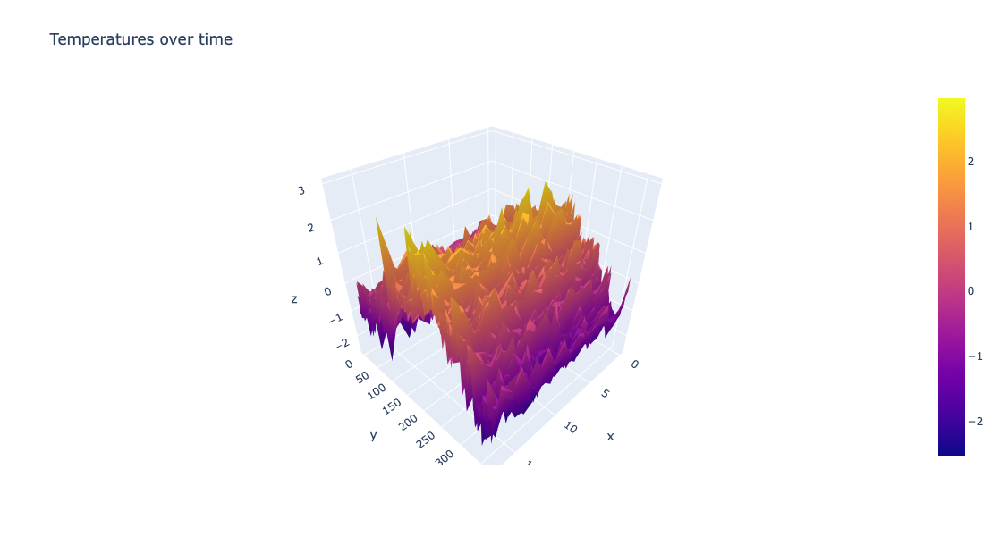

In [1062]:
# Plotting ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate it

fig = go.Figure(data=[go.Surface(z=notempyear_stockholm_1990.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [1063]:
# Creating a set of data from 1 to 365 (or to 366 if it's a leap year!)
# Scaling this by 100 as the index is made. This will help the gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [1064]:
# Checking the number of rows
n_rows_stockholm_2020 = climatewins_stockholm_2020.shape[0]
n_rows_stockholm_2020

366

In [1065]:
# Translating the chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows_stockholm_2020,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows_stockholm_2020,1))
X = np.concatenate((ones, X), axis=1)
y=climatewins_stockholm_2020['STOCKHOLM_temp_mean'].to_numpy().reshape(n_rows_stockholm_2020,1) # STOCKHOLM weather station chosen

In [1066]:
# Checking the dimensions of X and Y 
X.shape, y.shape

((366, 2), (366, 1))

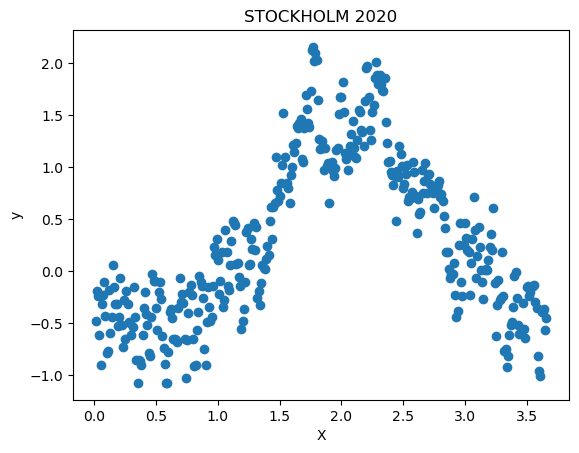

In [1067]:
# Looking at one year of temperature data over time
plt.scatter(x=index['index'], y=climatewins_stockholm_2020['STOCKHOLM_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('STOCKHOLM 2020');

# Displaying the visualization
plt.show()

In [1068]:
# Checking the MINIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_stockholm_2020['STOCKHOLM_temp_mean'].min()

-1.0753039870799852

In [1069]:
# Checking the MAXIMUM temperature (Note gradient descent is not actually finding this number)
climatewins_stockholm_2020['STOCKHOLM_temp_mean'].max()

2.1592464517522667

In [1070]:
# Computing the LOSS function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [1071]:
# Computing the cost
compute_cost(X,y)

array([0.35415859])

In [1072]:
# This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [1073]:
%%time
# This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
# You will need to adjust these numbers

num_iterations=150 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: user 136 ms, sys: 1.94 ms, total: 137 ms
Wall time: 47.2 ms


In [1074]:
theta

array([[-0.0506269 ],
       [ 0.18933487]])

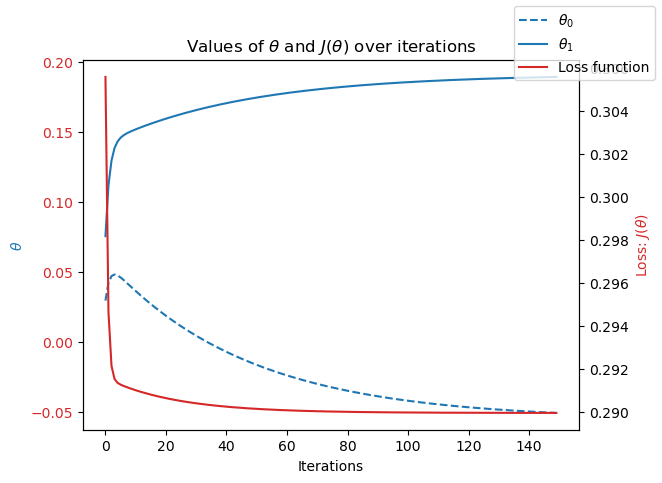

In [1075]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

# Displaying the visualization
plt.show()

In [1076]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: user 1.44 s, sys: 35.9 ms, total: 1.47 s
Wall time: 1.05 s


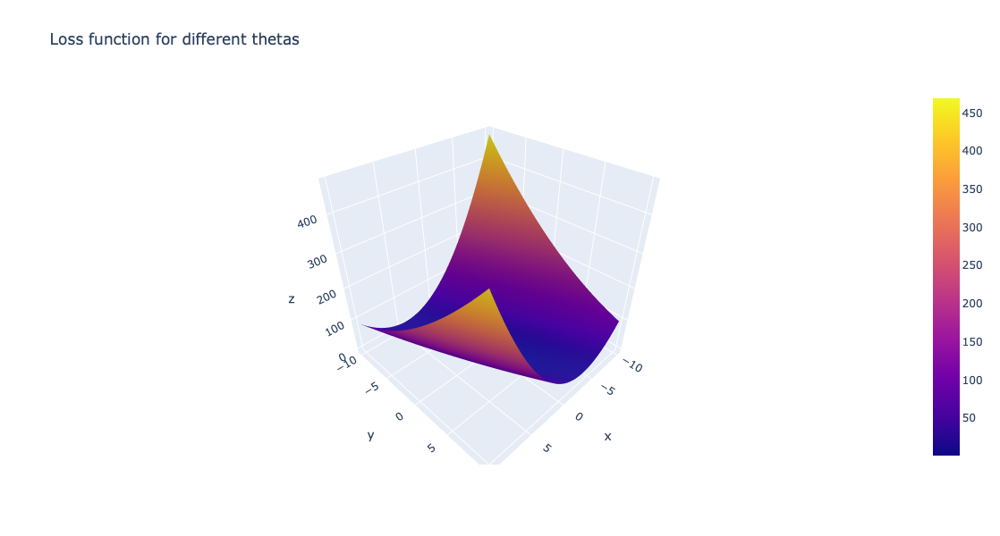

In [1077]:
# Showing the loss function
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()